In [1]:
dir_ = '/mnt/archive/Antonio/data/manta/smdata/2017-05-23/'
fname = dir_ + '08_12d_inplace.hdf5'

In [2]:
plot_timetraces = True
and_gate_size_sel_kws = dict(th1=20, gamma=0.5, add_aex=True)
and_gate_min_rate_cps = 30e3
skip_ch = (12, 13)

In [3]:
from pathlib import Path

In [4]:
fname = Path(fname)

In [5]:
num_fields = 2
max_len = 26
mlabel = '_'.join([fname.parts[-2]] + fname.stem.split('_')[:num_fields])[:max_len]
mlabel

'2017-05-23_08_12d'

In [6]:
assert fname.is_file(), 'File not found.'

# Imports

In [7]:
import os
from pathlib import Path
import numpy as np
from IPython.display import display, HTML, Math
import pandas as pd
import matplotlib as mpl
mpl.rcParams['font.sans-serif'].insert(0, 'Arial')
%matplotlib inline
import matplotlib.pyplot as plt
from heatmap import heatmap48, spotsh, spotsv
import pybroom as br

/home/anto/miniconda3/envs/py36/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)


In [8]:
plt.rcParams['font.size'] = 14

In [9]:
%config InlineBackend.figure_format = 'retina'

In [10]:
from fretbursts import *

 - Optimized (cython) burst search loaded.
 - Optimized (cython) photon counting loaded.
--------------------------------------------------------------
 You are running FRETBursts (version 0.6.4+59.gc97d4a8).

 If you use this software please cite the following paper:

   FRETBursts: An Open Source Toolkit for Analysis of Freely-Diffusing Single-Molecule FRET
   Ingargiola et al. (2016). http://dx.doi.org/10.1371/journal.pone.0160716 

--------------------------------------------------------------


In [11]:
sns = init_notebook(apionly=True)

In [12]:
pd.options.display.max_columns = 48
pd.options.display.max_rows = 48

def make_df_bursts(list_of_columns):
    ncols = 48
    assert len(list_of_columns) == ncols
    nrows = max(len(x) for x in list_of_columns)
    columns = np.arange(ncols)
    df = pd.DataFrame(columns=columns, index=np.arange(nrows), dtype=float)
    df.columns.name = 'spot'
    for col, col_data in zip(columns, list_of_columns):
        df.iloc[:len(col_data), col] = col_data
    return df

def make_df_spots(list_of_tuples=None):
    nrows = 48
    df = pd.DataFrame(index=np.arange(nrows))
    if list_of_tuples is None:
        list_of_tuples = []
    for col, col_data in list_of_tuples:
        df[col] = col_data
    return df

In [13]:
def cal_phrate(d, stream, phrates=None, recompute=False):
    Path('results').mkdir(exist_ok=True)
    if phrates is None:
        phrates = {}
    phrates_fname = Path('results/%s_phrate_%s.csv' % (mlabel, stream))
    phrates_fnameB = Path('results/%s_phrate_%sB.csv' % (mlabel, stream))
    if phrates_fname.is_file() and not recompute:
        phrates[str(stream)] = pd.read_csv(phrates_fname, index_col=0)
        phrates[str(stream)].index.name = 'spot'
        phr = pd.read_csv(phrates_fnameB, index_col=0)
        phr.columns = [int(c) for c in phr.columns]
        phr.columns.name = 'spot'
        phrates[str(stream)+'B'] = phr
    else:
        try:
            d.calc_max_rate(m=10, ph_sel=stream, compact=True)
        except ValueError:
            d.calc_max_rate(m=10, ph_sel=stream, compact=False)
        phrates[str(stream)+'B'] = make_df_bursts(d.max_rate)
        phrates[str(stream)] = (make_df_spots()
                        .assign(**{'num_bursts': d.num_bursts})
                        .assign(**{'num_nans': [np.isnan(x).sum() for x in d.max_rate]})
                        .assign(**{'num_valid': lambda x: x.num_bursts - x.num_nans})
                        .assign(**{'valid_fraction': lambda x: 100 * x.num_valid / x.num_bursts})
                      )
        phrates[str(stream)].to_csv(phrates_fname)
        phrates[str(stream)+'B'].to_csv(phrates_fnameB)

    print('   Valid fraction (mean of all ch): %.1f %%' %
          phrates[str(stream)].valid_fraction.mean())
    return phrates

In [14]:
def info_html(d):
    Dex, Aex = d.setup['excitation_input_powers']*1e3
    s = """
    <h3>File: &nbsp; &nbsp; &nbsp; {fname}</h3>
    <blockquote><p class="lead">{descr}</p></blockquote>
    <ul>
    <li><span style='display: inline-block; width: 150px;'>Acquisition duration:</span> {time:.1f} s </li>
    <li><span style='display: inline-block; width: 150px;'>Laser power:</span>  <b>{Dex:.0f}mW</b> @ 532nm &nbsp;&nbsp;&nbsp;  
                                                                                <b>{Aex:.0f}mW</b> @ 628nm </li>
    <li><span style='display: inline-block; width: 150px;'>ALEX period [offset]: </span> {period} ({period_us:.1f} μs)  [{offset}] </li></ul>
    """.format(fname=fname, time=float(d.acquisition_duration), Dex=Dex, Aex=Aex, 
               period=d.alex_period, period_us=d.alex_period*d.clk_p*1e6, offset=d.offset,
               descr=d.description.decode())
    return HTML(s)

In [15]:
save_figures = True
savefigdir = 'figures'
highres = True

def save_name(name, folder='.', nospaces=False):
    sname = '%s/%s_%s' % (folder, mlabel, name)
    if nospaces:
        sname = sname.replace(' ', '_')
    return sname 
    
def savefig(name, nospaces=True, **kwargs):
    if not save_figures:
        return
    savefigpath = Path(savefigdir)
    savefigpath.mkdir(exist_ok=True)
    kwargs_ = dict(dpi=100, bbox_inches='tight')
                   #frameon=True, facecolor='white', transparent=False)
    kwargs_.update(kwargs)
    fname = save_name(name, savefigdir, nospaces=nospaces)
    plt.savefig(fname, **kwargs_)
    print('Saved: %s.png' % fname, flush=True)
    if highres:
        kwargs_['dpi'] = 300
        fname = save_name(name.strip('.png') + '_highres', savefigdir, nospaces=nospaces)
        print('Saved hires: %s.png' % fname, flush=True)
        plt.savefig(fname, **kwargs_)

# Load Data

In [16]:
d = loader.photon_hdf5(str(fname), ondisk=True)

In [17]:
info_html(d)

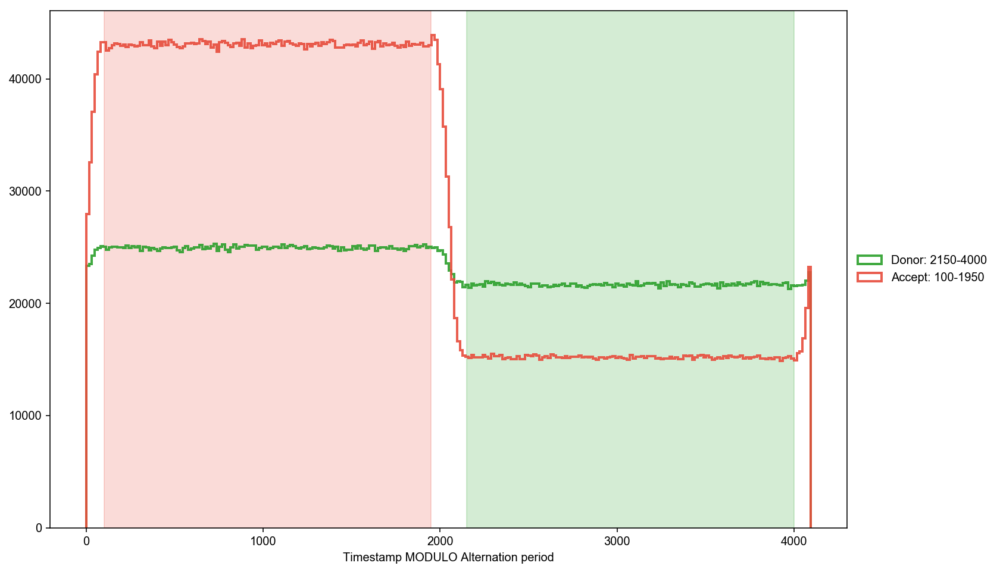

In [18]:
fig, ax = plt.subplots(figsize=(12, 8))
bpl.plot_alternation_hist_usalex(d, ax=ax, bins=np.arange(0, 4097, 16))

In [19]:
%%timeit -n1 -r1 
loader.alex_apply_period(d)

# Total photons (after ALEX selection):   659,996,529
#  D  photons in D+A excitation periods:  288,157,984
#  A  photons in D+A excitation periods:  371,838,545
# D+A photons in  D  excitation period:   253,115,865
# D+A photons in  A  excitation period:   406,880,664

3min 4s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


# Analysis

## Timetraces

Saved: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=1-2.png.png
Saved hires: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=1-2_highres.png
Saved: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=353-354.png.png
Saved hires: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=353-354_highres.png
Saved: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=705-706.png.png
Saved hires: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=705-706_highres.png
Saved: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=1056-1057.png.png
Saved hires: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=1056-1057_highres.png
Saved: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=1408-1409.png.png
Saved hires: figures/2017-05-23_08_12d_2017-05-23_08_12d_timetrace_t=1408-1409_highres.png


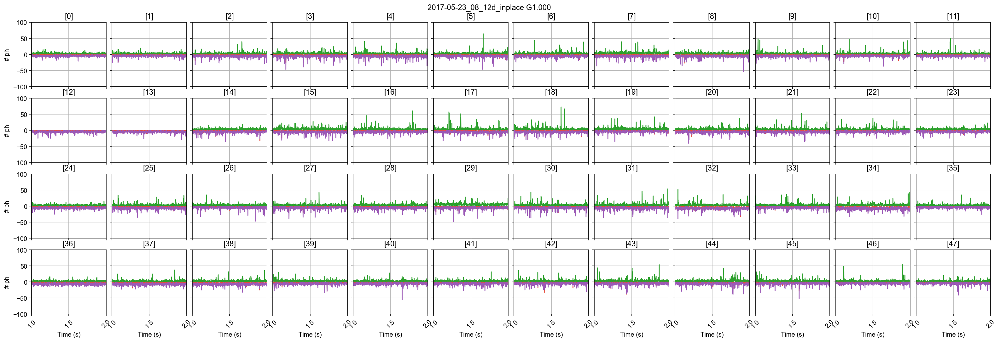

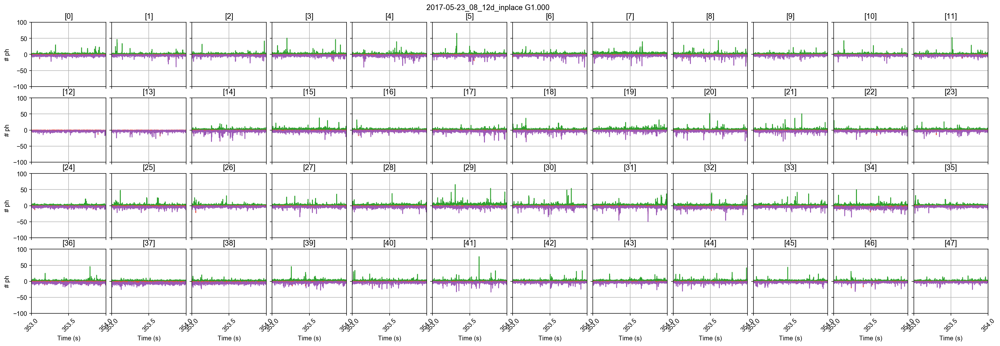

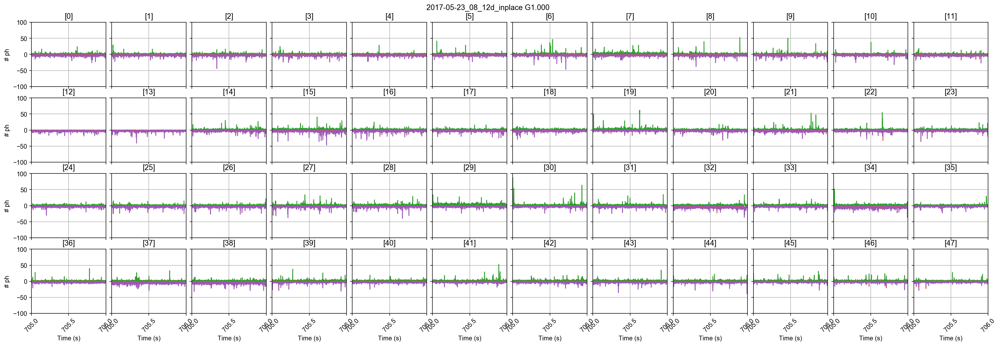

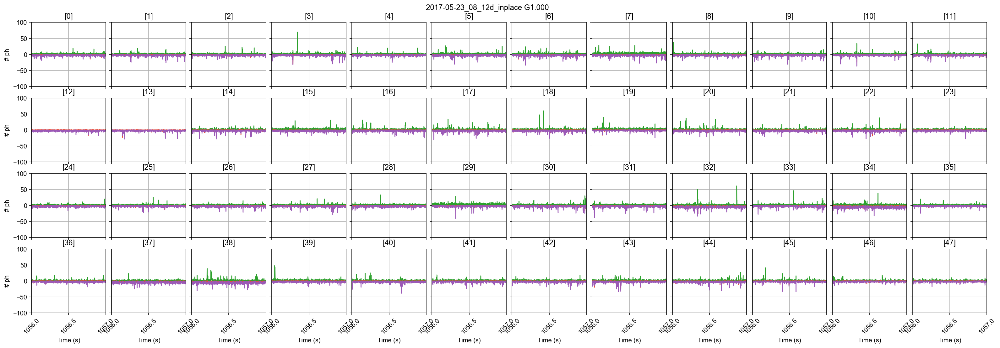

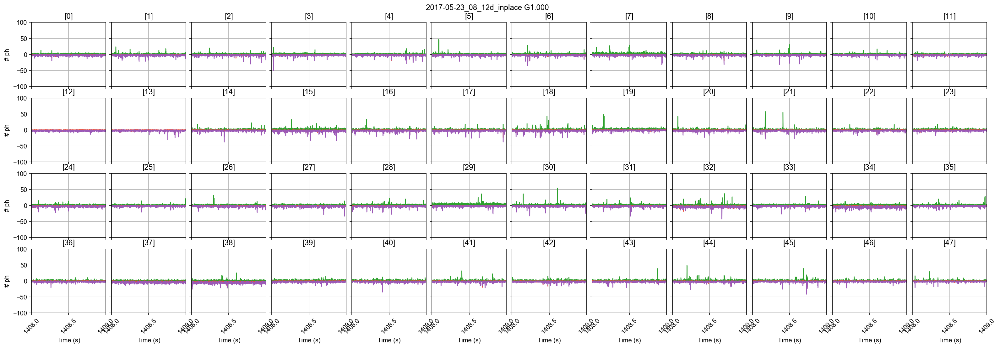

In [20]:
if plot_timetraces:
    num_time_points = 5
    kws = dict(figsize=(24, 8), xrotation=45)
    
    # Timepoints equally distributed along the measurement
    time_points = np.round(np.linspace(d.time_min+1, d.time_max-2, num=num_time_points))

    for i in time_points:
        dplot(d, timetrace, tmin=i, tmax=i+1, **kws);
        plt.ylim(-100, 100)
        savefig("%s_timetrace_t=%d-%d.png" % (mlabel, i, i+1))

## Background

In [21]:
d.calc_bg_cache(bg.exp_fit, time_s=5, tail_min_us='auto', F_bg=1.7)

 * Loading BG rates from cache ... 
 - Loading bakground data:  [DONE]


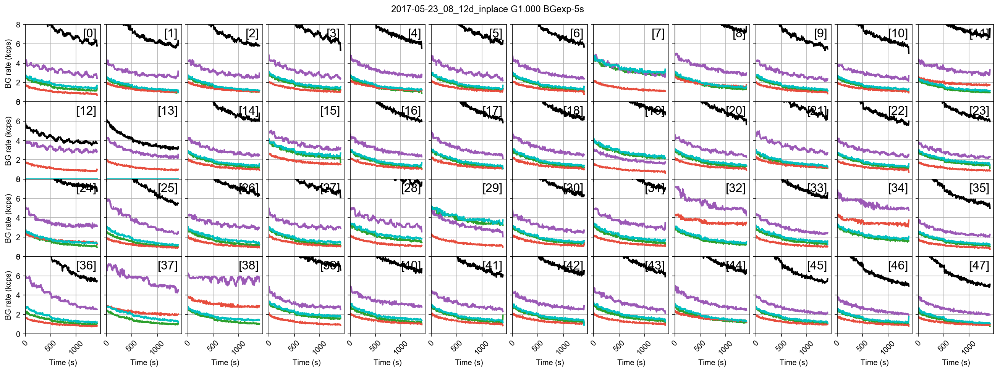

In [22]:
ax = dplot(d, timetrace_bg, show_da=True, hspace=0, wspace=0.08,
           plot_style=dict(marker=None), title='right top', 
           title_kws=dict(fontsize=16), xrotation=45);
plt.xlim(0)
plt.ylim(0, 8);

In [23]:
bg_AexDem = d.bg_from(Ph_sel(Aex='Dem'))
bg_AexAem = d.bg_from(Ph_sel(Aex='Aem'))
bg_DexDem = d.bg_from(Ph_sel(Dex='Dem'))
bg_DexAem = d.bg_from(Ph_sel(Dex='Aem'))

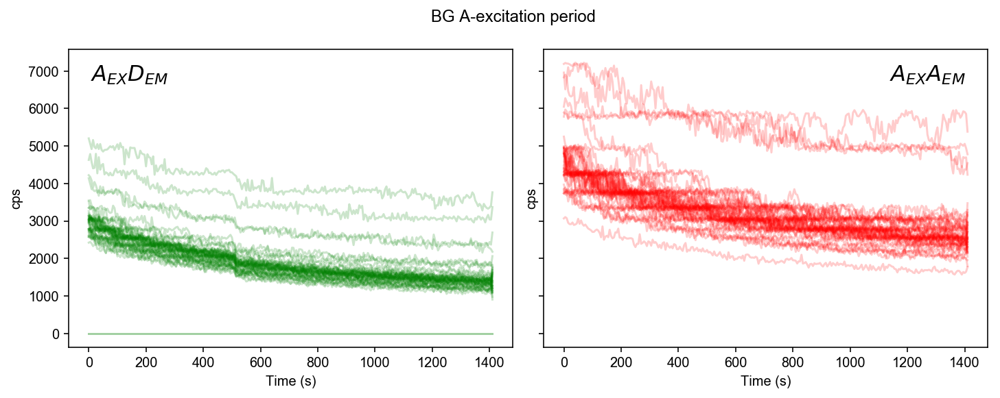

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG A-excitation period")
t = np.arange(len(bg_AexDem[0])) * 5
ax[0].plot(t, np.array(bg_AexDem).T, color='g', alpha=0.2);
ax[1].plot(t, np.array(bg_AexAem).T, color='r', alpha=0.2);
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$A_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$A_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes);

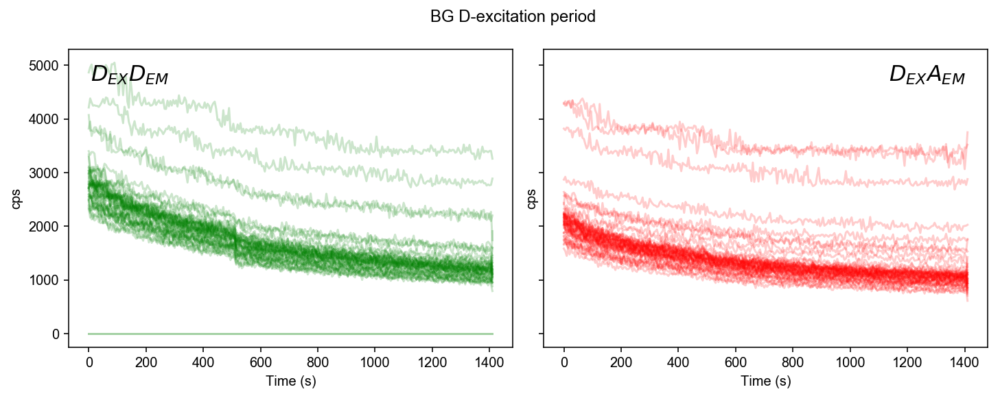

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG D-excitation period")
t = np.arange(len(bg_DexDem[0])) * 5
ax[0].plot(t, np.array(bg_DexDem).T, color='g', alpha=0.2);
ax[1].plot(t, np.array(bg_DexAem).T, color='r', alpha=0.2);
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$D_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$D_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes);

## Burst search

In [26]:
d.burst_search(min_rate_cps=50e3, pax=True)

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]


In [27]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

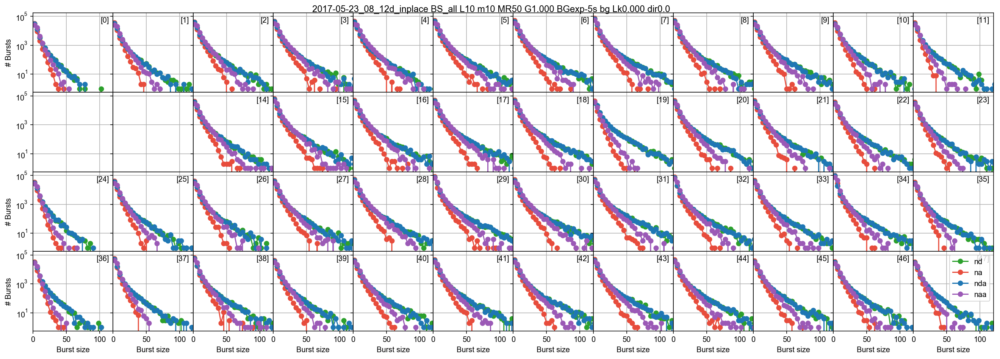

In [28]:
dplot(d, hist_size_all, **kws);
plt.xlim(0, 120)
plt.legend();

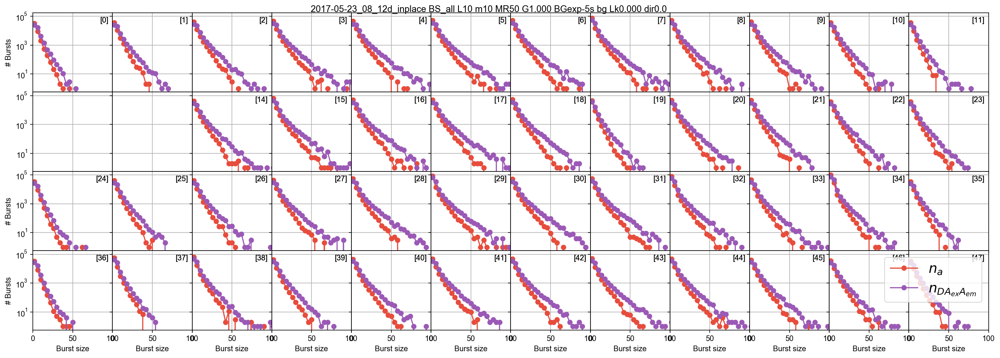

In [29]:
kws.update(title_nbursts=False)
ax = dplot(d, hist_size, which='na', **kws);
dplot(d, hist_size, which='naa', AX=ax, **kws);
plt.xlim(0, 100);
plt.legend(['$n_a$', '$n_{DA_{ex}A_{em}}$'], fontsize=18, loc='upper right')

<IPython.core.display.Math object>

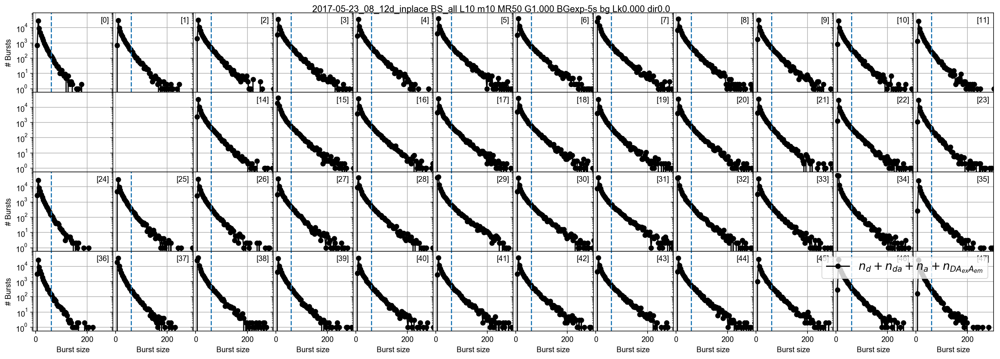

In [30]:
size_th = 60
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.legend(fontsize=15, loc='upper right');
Math(d._burst_sizes_pax_formula(**size_sel_kws))

In [31]:
bs_mean = []
for i in range(48):
    sizes_ch = d.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean.append(sizes_ch[tail].mean() - size_th)

Saved: figures/2017-05-23_08_12d_heatmap_burst_sizes.png
Saved hires: figures/2017-05-23_08_12d_heatmap_burst_sizes_highres.png


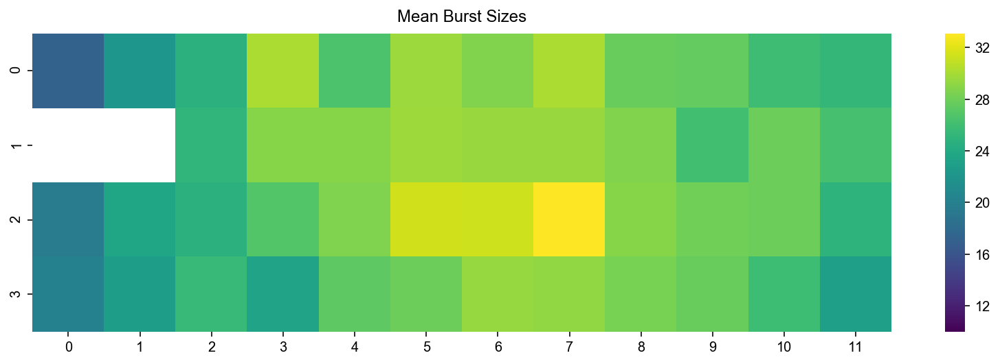

In [32]:
heatmap48(bs_mean, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10)
savefig('heatmap_burst_sizes')

(-0.5, 4)

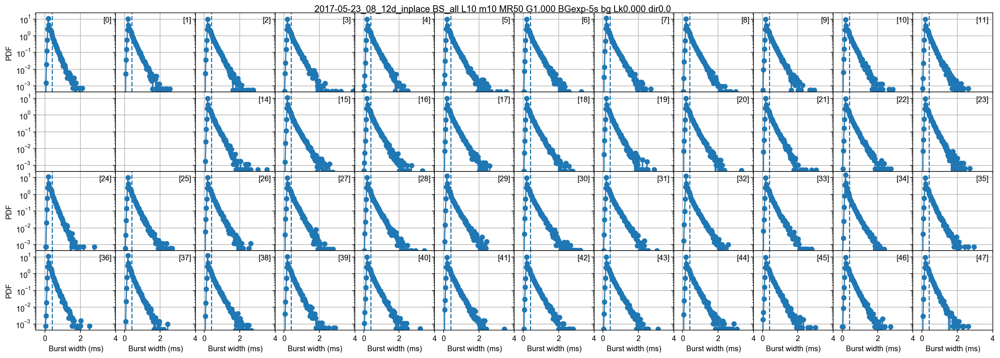

In [33]:
width_th = 0.4
dplot(d, hist_width, vline=width_th, **kws);
plt.xlim(-0.5, 4)

In [34]:
bw_mean = []
for i in range(48):
    widths_ch = d.mburst[i].width * d.clk_p * 1e3
    tail = widths_ch > width_th
    bw_mean.append(widths_ch[tail].mean() - width_th)

Saved: figures/2017-05-23_08_12d_heatmap_burst_widths.png
Saved hires: figures/2017-05-23_08_12d_heatmap_burst_widths_highres.png


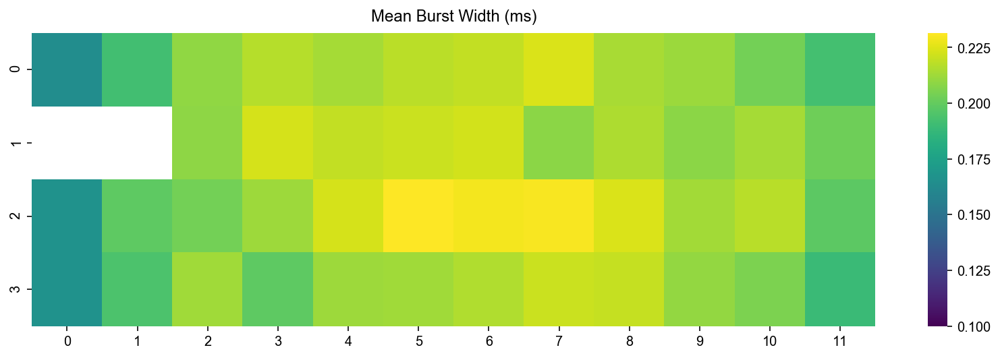

In [35]:
heatmap48(bw_mean, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1)
savefig('heatmap_burst_widths')

In [36]:
# Use recompute=True if changing burst-search parameters
recompute = False
phrates = {}
streams = ('all', 'DexDem', 'AexDem', 'DexAem', 'AexAem', )
for stream in streams:
    print(' - Computing peak photon rates for %6s stream.' % str(Ph_sel.from_str(stream)))
    cal_phrate(d, stream=Ph_sel.from_str(stream), phrates=phrates, recompute=recompute)

 - Computing peak photon rates for    all stream.
   Valid fraction (mean of all ch): 100.0 %
 - Computing peak photon rates for DexDem stream.
   Valid fraction (mean of all ch): 13.9 %
 - Computing peak photon rates for AexDem stream.
   Valid fraction (mean of all ch): 14.2 %
 - Computing peak photon rates for DexAem stream.
   Valid fraction (mean of all ch): 7.2 %
 - Computing peak photon rates for AexAem stream.
   Valid fraction (mean of all ch): 18.2 %


Saved: figures/2017-05-23_08_12d_peak_phrate_all.png
Saved hires: figures/2017-05-23_08_12d_eak_phrate_all_highres.png


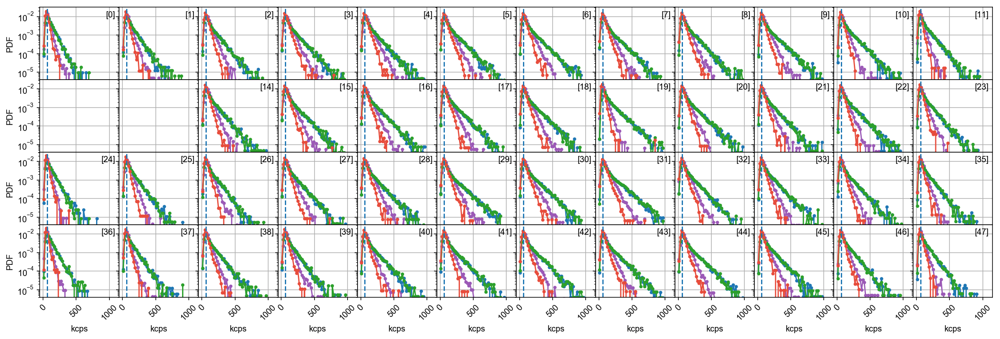

In [37]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, ms=3), **kws);
dplot(phrates['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', ms=3), AX=ax, **kws);
dplot(phrates['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, ms=3), AX=ax, **kws);
kws.update(vline=60, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, ms=3), AX=ax, **kws);
plt.xlim(-50, 1150);
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
savefig('peak_phrate_all')

In [38]:
phr_th = 60e3
for stream in streams:
    phrates[stream]['mean'] = 0
    phr = phrates[stream+'B']
    for ich in range(48):
        valid = ~pd.isnull(phr[ich])
        phr_valid = phr[ich][valid]
        m = phr_valid[phr_valid >= phr_th].mean() - phr_th
        phrates[stream].loc[ich, 'mean'] = np.round(m*1e-3, 1)

In [39]:
streams

('all', 'DexDem', 'AexDem', 'DexAem', 'AexAem')

Saved: figures/2017-05-23_08_12d_peak_phrate_heatmap_all.png
Saved hires: figures/2017-05-23_08_12d_eak_phrate_heatmap_all_highres.png
Saved: figures/2017-05-23_08_12d_peak_phrate_heatmap_DexDem.png
Saved hires: figures/2017-05-23_08_12d_eak_phrate_heatmap_DexDem_highres.png
Saved: figures/2017-05-23_08_12d_peak_phrate_heatmap_AexDem.png
Saved hires: figures/2017-05-23_08_12d_eak_phrate_heatmap_AexDem_highres.png
Saved: figures/2017-05-23_08_12d_peak_phrate_heatmap_DexAem.png
Saved hires: figures/2017-05-23_08_12d_eak_phrate_heatmap_DexAem_highres.png
Saved: figures/2017-05-23_08_12d_peak_phrate_heatmap_AexAem.png
Saved hires: figures/2017-05-23_08_12d_eak_phrate_heatmap_AexAem_highres.png


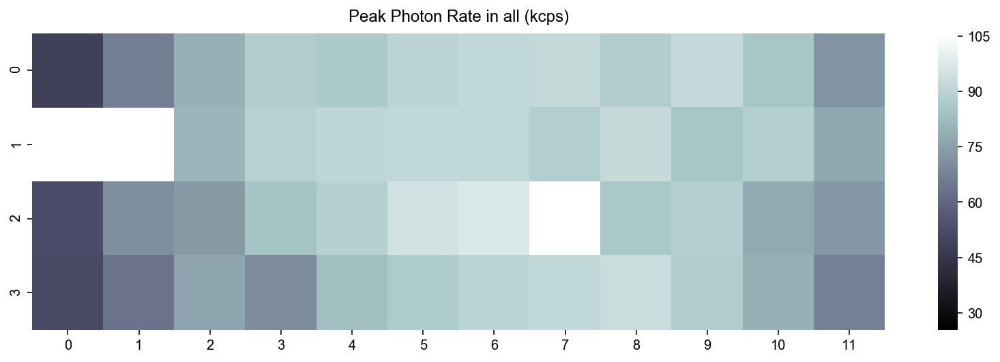

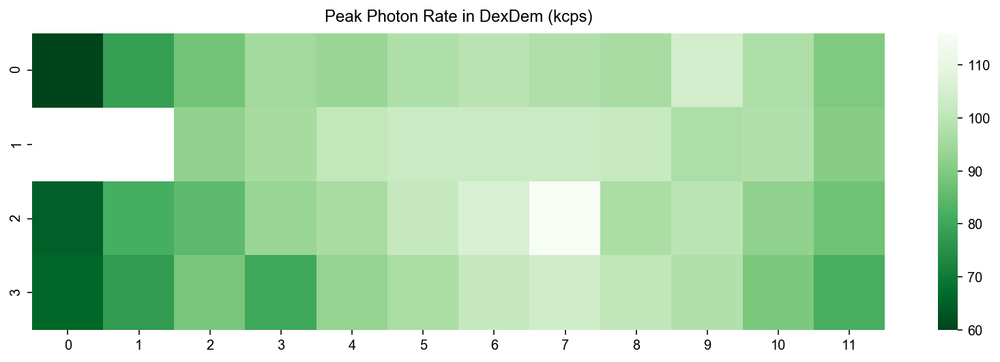

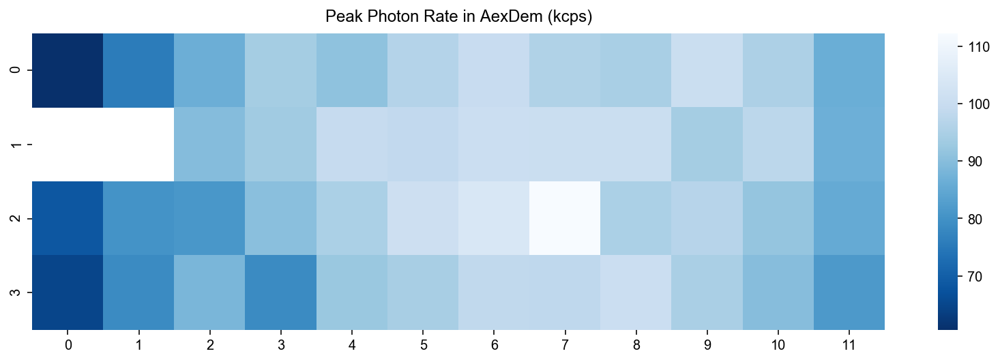

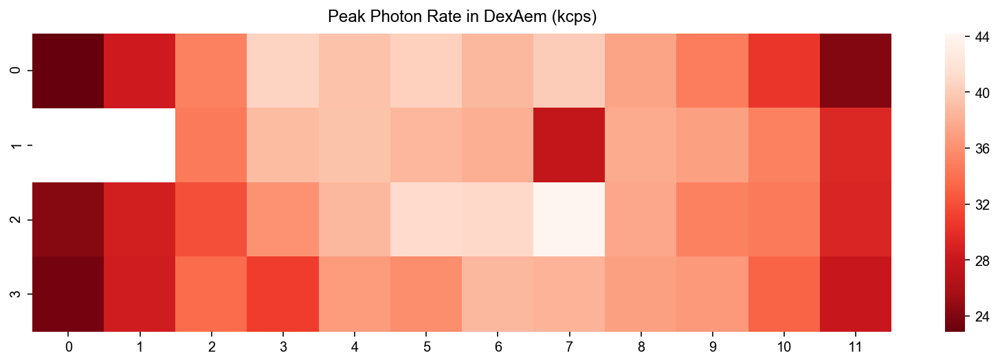

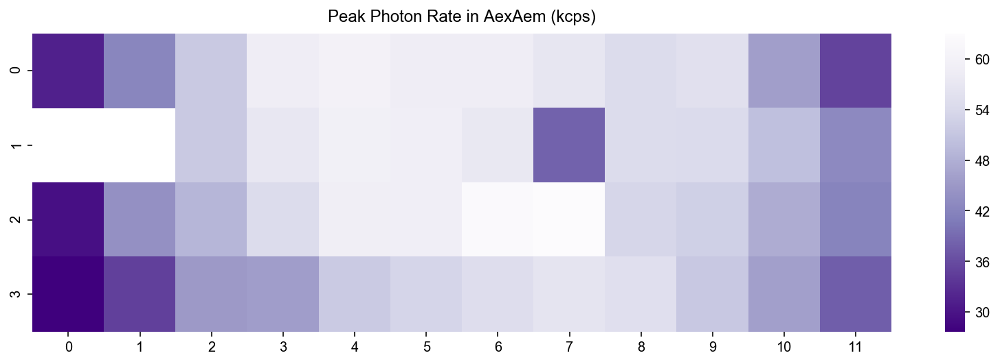

In [40]:
cmaps = ('bone', 'Greens_r', 'Blues_r', 'Reds_r', 'Purples_r')
for stream, cmap in zip(streams, cmaps):
    heatmap48(phrates[stream]['mean'], cmap=cmap, skip_ch=skip_ch,
              title="Peak Photon Rate in %s (kcps)" % stream)
    savefig('peak_phrate_heatmap_%s' % stream)

## Burst selection

In [41]:
size_th = 80
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)
ds = d.select_bursts(select_bursts.size, th1=size_th, **size_sel_kws)

Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds.nd, ds.na, ds.naa)]
ds.add(Su=Su)
Su2 = [(nd + nda + na)/(nd + nda + na + naa) 
       for nd, na, nda, naa in zip(ds.nd, ds.na, ds.nda, ds.naa)]
ds.add(Su2=Su2)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

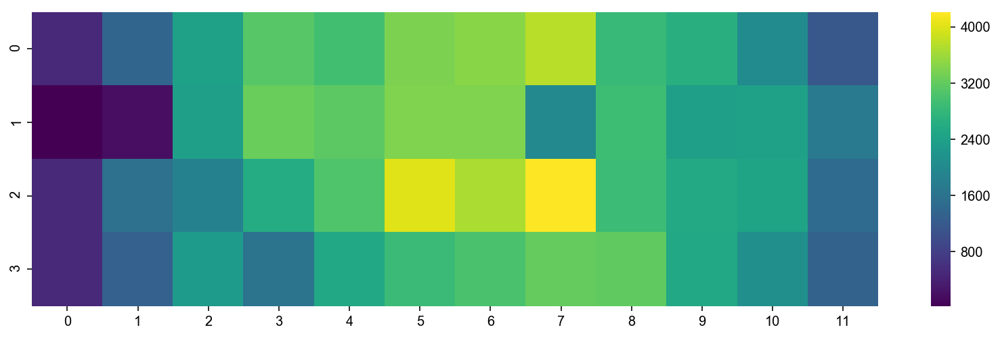

In [42]:
heatmap48(ds.num_bursts)

Saved: figures/2017-05-23_08_12d_48spot_hist_E_all-bursts.png
Saved hires: figures/2017-05-23_08_12d_48spot_hist_E_all-bursts_highres.png


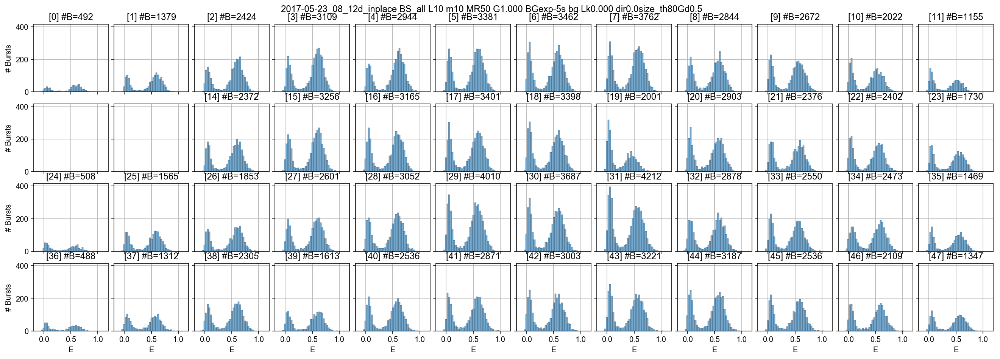

In [43]:
ax = dplot(ds, hist_fret, pdf=False, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts');
# plt.ylim(0, 600);
savefig('48spot hist E all-bursts')

Saved: figures/2017-05-23_08_12d_48spot_hist_Su.png
Saved hires: figures/2017-05-23_08_12d_48spot_hist_Su_highres.png


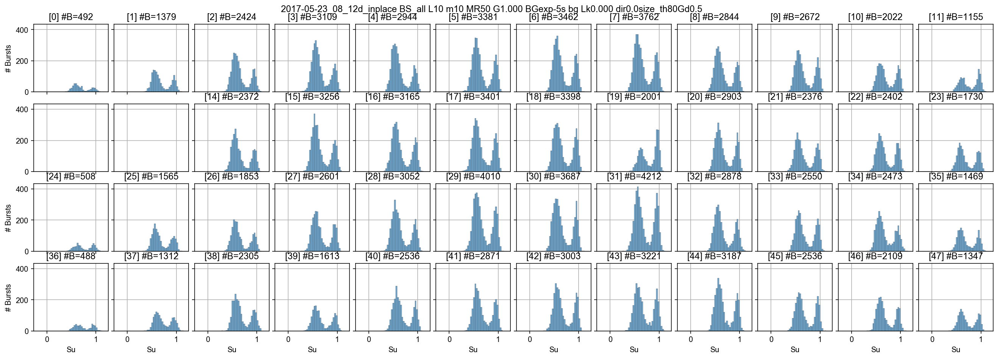

In [44]:
dplot(ds, hist_burst_data, data_name='Su', pdf=False, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts');
savefig('48spot hist Su')

Saved: figures/2017-05-23_08_12d_48spot_alex_hist_S_all-bursts.png
Saved hires: figures/2017-05-23_08_12d_48spot_alex_hist_S_all-bursts_highres.png


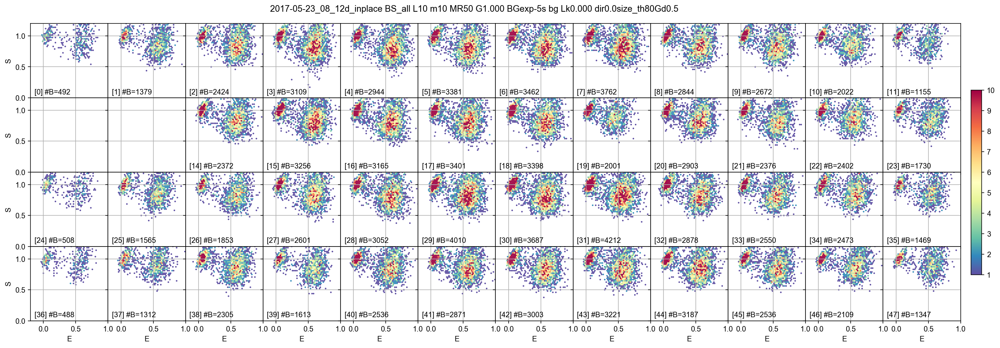

In [45]:
ax = dplot(ds, hexbin_alex, vmax=10, skip_ch=skip_ch, wspace=0, hspace=0, gridsize=60,
           title='bottom left', title_bg=False);
ax0 = ax[0,0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.colorbar(cax=cax)
plt.setp(ax[:, 0], ylabel='S');
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
savefig('48spot alex hist S all-bursts')

Saved: figures/2017-05-23_08_12d_48spot_alex_hist_Su_all-bursts.png
Saved hires: figures/2017-05-23_08_12d_48spot_alex_hist_Su_all-bursts_highres.png


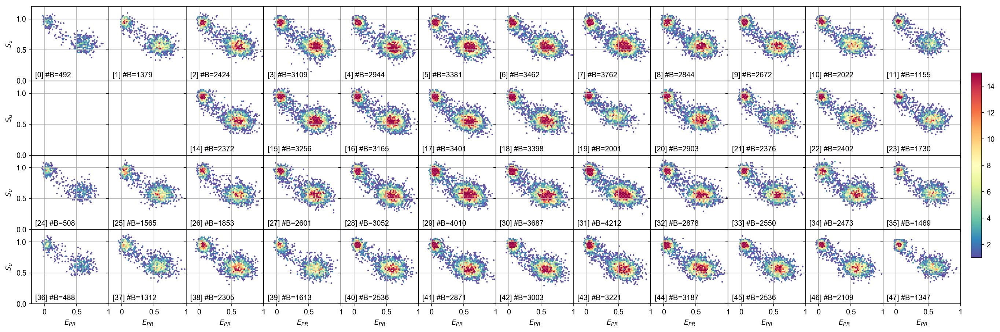

In [46]:
ax = dplot(ds, hexbin_alex, S_name='Su', vmax=15, skip_ch=skip_ch, xrotation=0,
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_xticklabels(['0', '0.5', '1'])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
plt.suptitle('')
savefig('48spot alex hist Su all-bursts')

Saved: figures/2017-05-23_08_12d_48spot_alex_hist_Su_all-bursts.png
Saved hires: figures/2017-05-23_08_12d_48spot_alex_hist_Su_all-bursts_highres.png


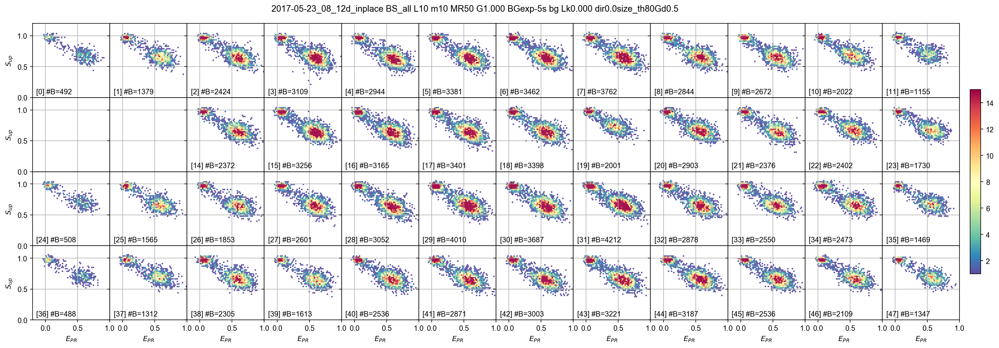

In [47]:
ax = dplot(ds, hexbin_alex, S_name='Su2', vmax=15, skip_ch=skip_ch, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_{up}$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
savefig('48spot alex hist Su all-bursts')

In [48]:
size_Dex = 80
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

In [49]:
size_Aex = 40
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=0.5,
                   na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d._burst_sizes_pax_formula(**naa_sel_kws))

<IPython.core.display.Math object>

In [50]:
ds1 = d.select_bursts(select_bursts.size, th1=size_Dex, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds1.nd, ds1.na, ds1.naa)]
ds1.add(Su=Su)
dss = ds1.select_bursts(select_bursts.size, th1=size_Aex, **naa_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dss.nd, dss.na, dss.naa)]
dss.add(Su=Su)

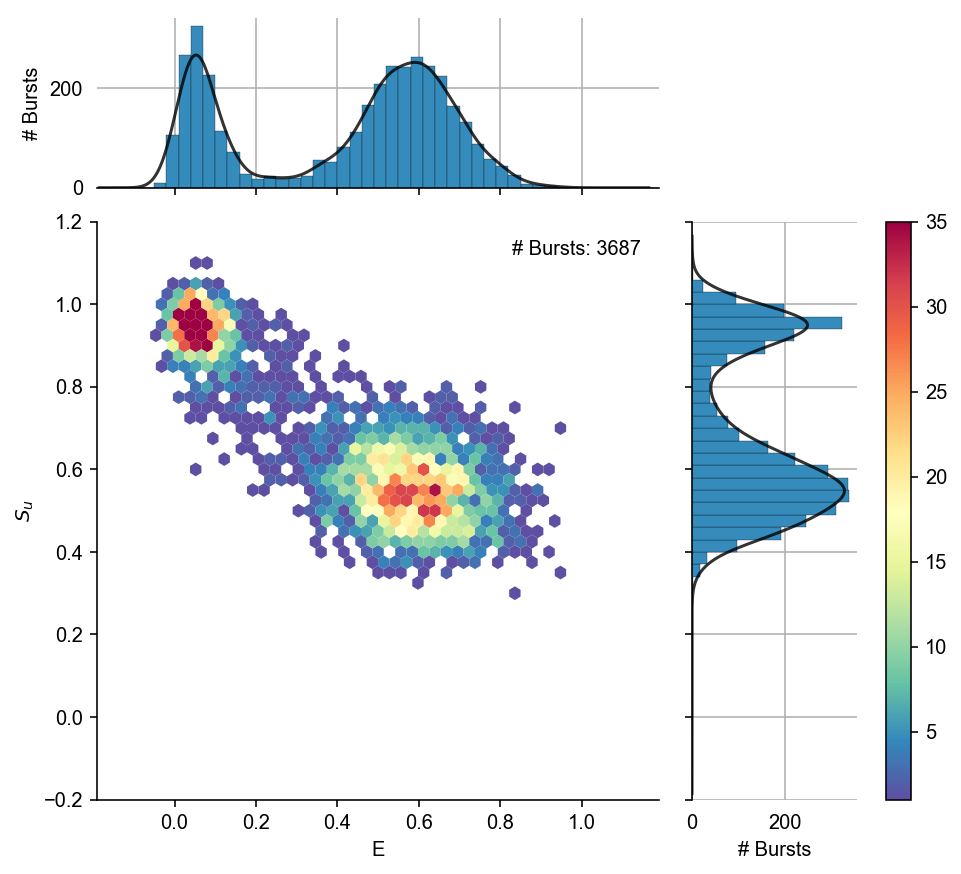

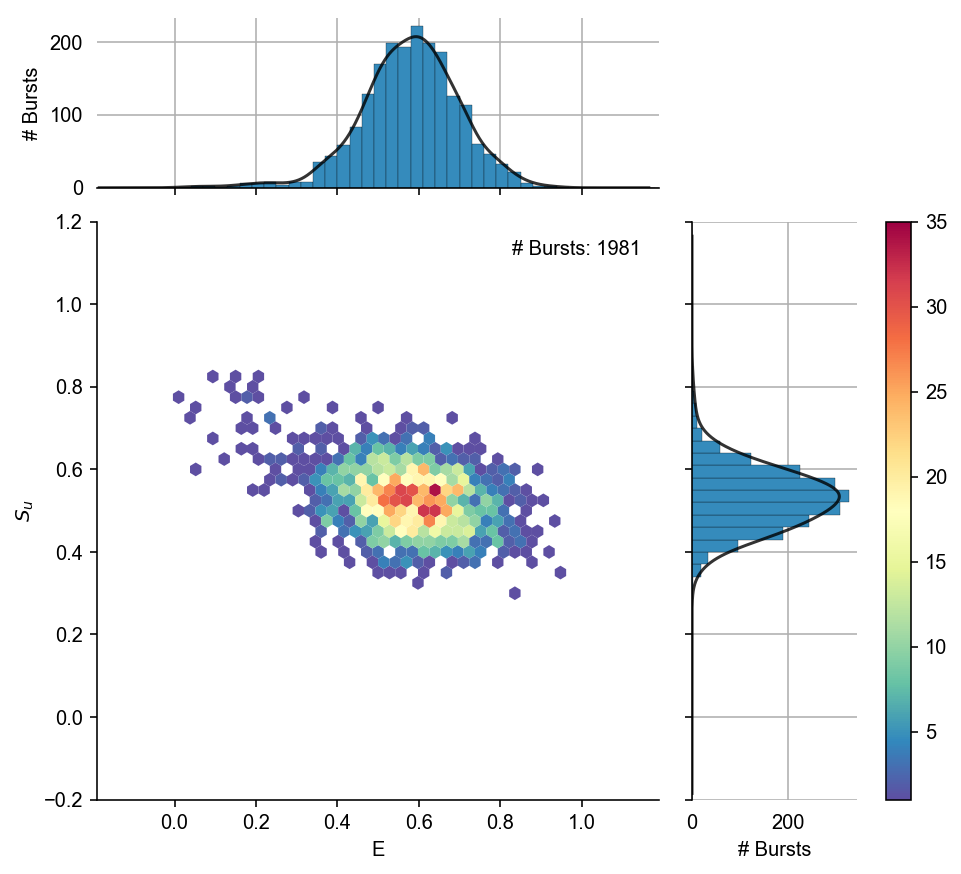

In [51]:
g = alex_jointplot(ds1, i=30, vmax=35, S_name='Su')
g.ax_joint.set_ylabel('$S_u$')
g = alex_jointplot(dss, i=30, vmax=35, S_name='Su')
g.ax_joint.set_ylabel('$S_u$')

Saved: figures/2017-05-23_08_12d_48spot_alex_hist_Su_naa_AND_size_selection.png
Saved hires: figures/2017-05-23_08_12d_48spot_alex_hist_Su_naa_AND_size_selectio_highres.png


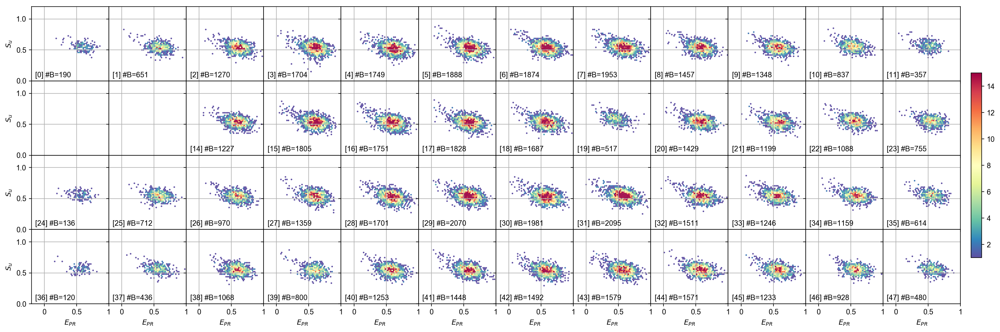

In [52]:
ax = dplot(dss, hexbin_alex, S_name='Su', vmax=15, skip_ch=skip_ch, xrotation=0,
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_xticklabels(['0', '0.5', '1'])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
plt.suptitle('')
savefig('48spot alex hist Su naa AND size selection')

## Fitting

### FRET population fit

In [53]:
ds_fret = dss

In [54]:
E_fitter = bext.bursts_fitter(ds_fret, 'E', skip_ch=skip_ch)
model = mfit.factory_gaussian()
model.set_param_hint('center', value=0.5, min=0, max=1)
model.set_param_hint('sigma', value=0.1, min=0.03, max=0.2)
model.print_param_hints()

Name          Value      Min      Max     Vary    Expr    
amplitude         1     -inf      inf     True    
center          0.5        0        1     True    
fwhm            nan     -inf      inf     True    2.3548200*sigma
height          nan     -inf      inf     True    0.3989423*amplitude/max(1.e-15, sigma)
sigma           0.1     0.03      0.2     True    


In [55]:
E_fitter.fit_histogram(model, pdf=False, method='mealder')

/home/anto/src/FRETBursts/fretbursts/mfit.py:329: RuntimeWarning: invalid value encountered in true_divide
  self.hist_pdf /= self.hist_counts.sum(1)[:, np.newaxis]


Saved: figures/2017-05-23_08_12d_FRET_pop_-_E_hist_fit.png
Saved hires: figures/2017-05-23_08_12d_FRET_pop_-_E_hist_fit_highres.png


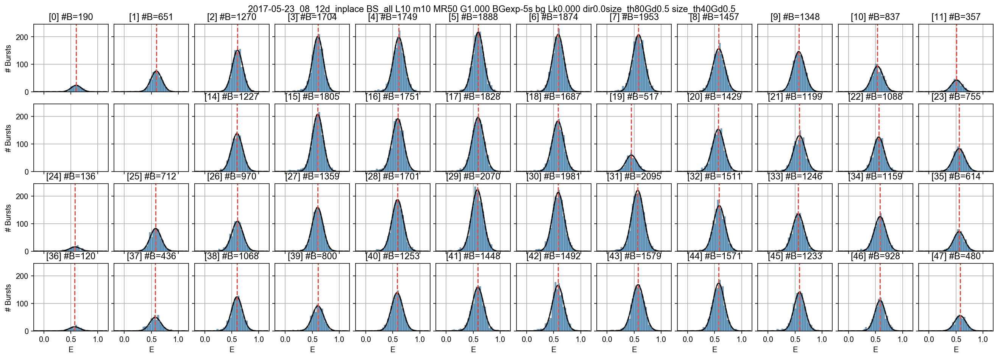

In [56]:
ax = dplot(ds_fret, hist_fret, pdf=False, show_model=True, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts')
savefig('FRET pop - E hist fit')

In [57]:
S_fitter = bext.bursts_fitter(ds_fret, 'S', skip_ch=skip_ch)
model = mfit.factory_gaussian()
model.set_param_hint('center', value=0.5, min=0, max=1)
model.set_param_hint('sigma', value=0.1, min=0.03, max=0.2)
model.print_param_hints()

Name          Value      Min      Max     Vary    Expr    
amplitude         1     -inf      inf     True    
center          0.5        0        1     True    
fwhm            nan     -inf      inf     True    2.3548200*sigma
height          nan     -inf      inf     True    0.3989423*amplitude/max(1.e-15, sigma)
sigma           0.1     0.03      0.2     True    


In [58]:
S_fitter.fit_histogram(model, pdf=False, method='mealder')

/home/anto/src/FRETBursts/fretbursts/mfit.py:329: RuntimeWarning: invalid value encountered in true_divide
  self.hist_pdf /= self.hist_counts.sum(1)[:, np.newaxis]


Saved: figures/2017-05-23_08_12d_FRET_pop_-_E_hist_fit.png
Saved hires: figures/2017-05-23_08_12d_FRET_pop_-_E_hist_fit_highres.png


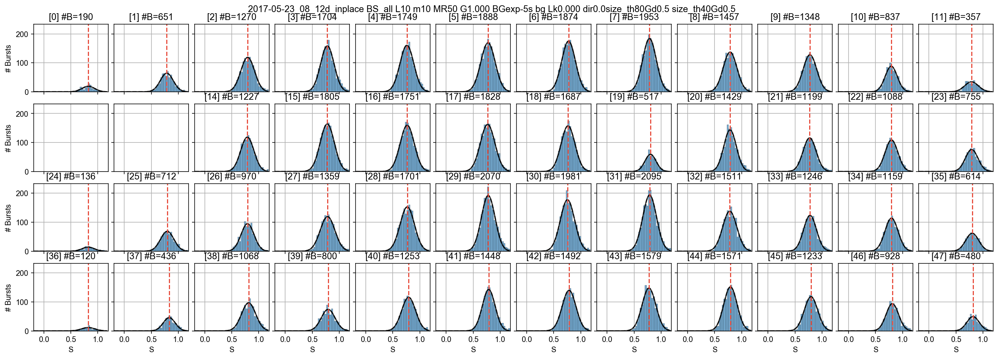

In [59]:
ax = dplot(ds_fret, hist_S, pdf=False, show_model=True, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts')
savefig('FRET pop - E hist fit');

In [60]:
Su_fitter = bext.bursts_fitter(ds_fret, 'Su', skip_ch=skip_ch)
model = mfit.factory_gaussian()
model.set_param_hint('center', value=0.5, min=0, max=1)
model.set_param_hint('sigma', value=0.1, min=0.03, max=0.2)
model.print_param_hints()

Name          Value      Min      Max     Vary    Expr    
amplitude         1     -inf      inf     True    
center          0.5        0        1     True    
fwhm            nan     -inf      inf     True    2.3548200*sigma
height          nan     -inf      inf     True    0.3989423*amplitude/max(1.e-15, sigma)
sigma           0.1     0.03      0.2     True    


In [61]:
Su_fitter.fit_histogram(model, pdf=False, method='mealder')

/home/anto/src/FRETBursts/fretbursts/mfit.py:329: RuntimeWarning: invalid value encountered in true_divide
  self.hist_pdf /= self.hist_counts.sum(1)[:, np.newaxis]


Saved: figures/2017-05-23_08_12d_FRET_pop_-_Su_hist_fit.png
Saved hires: figures/2017-05-23_08_12d_FRET_pop_-_Su_hist_fit_highres.png


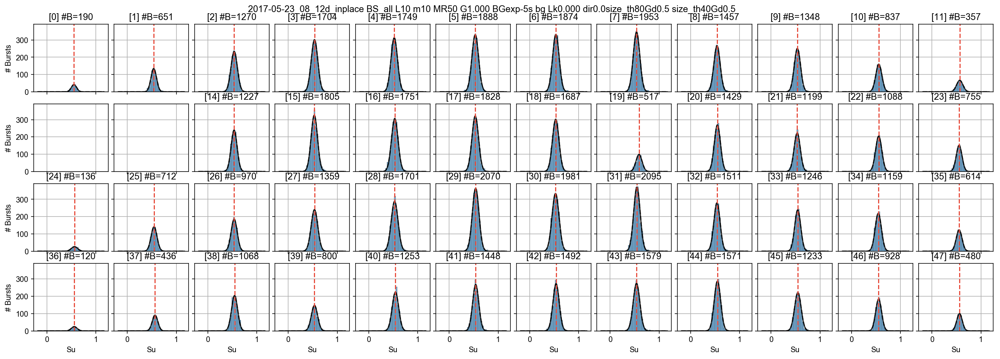

In [62]:
ax = dplot(ds_fret, hist_burst_data, data_name='Su', pdf=False, show_model=True, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts')
savefig('FRET pop - Su hist fit');

### FRET population tidy

In [63]:
def make_ES_fit_dataframe(E_df_fitt, S_df_fitt, Su_df_fitt, dx, skip_ch=skip_ch):
    pop_peak = E_df_fitt.query('name == "center"').loc[:,('value', 'spot')].set_index('spot')
    pop_peak.columns = ['E']
    pop_peak['S'] = S_df_fitt.query('name == "center"').loc[:,('value', 'spot')].set_index('spot')
    pop_peak['Su'] = Su_df_fitt.query('name == "center"').loc[:,('value', 'spot')].set_index('spot')
    pop_peak['num_bursts'] = dx.num_bursts

    pop_peak['E_sigma'] = E_df_fitt.query('name == "sigma"').loc[:,('value', 'spot')].set_index('spot')
    pop_peak['S_sigma'] = S_df_fitt.query('name == "sigma"').loc[:,('value', 'spot')].set_index('spot')
    pop_peak['Su_sigma'] = Su_df_fitt.query('name == "sigma"').loc[:,('value', 'spot')].set_index('spot')

    pop_peak['E_err'] = pop_peak['E_sigma'] / np.sqrt(pop_peak['num_bursts'])
    pop_peak['S_err'] = pop_peak['S_sigma'] / np.sqrt(pop_peak['num_bursts'])
    pop_peak['Su_err'] = pop_peak['Su_sigma'] / np.sqrt(pop_peak['num_bursts'])

    pop_peak.loc[skip_ch, (c for c in pop_peak.columns if c != 'num_bursts')] = np.nan

    # Add categorical column for pixel grouping
    # spotv is a global var from heatmatp.py
    pixel_groups = {
        'center': spotsv[4:8],
        'top':    spotsv[:4],
        'bottom': spotsv[-4:]}
    cat = {}
    for i, row in pop_peak.iterrows():
        for group, group_vals in pixel_groups.items(): 
            if i in group_vals:
                cat[i] = group
    pop_peak['Pixel'] = pd.Series(cat, dtype="category")
    return pop_peak

In [64]:
Efret_fitg = br.glance(E_fitter.fit_res, var_names='spot')
Sfret_fitg = br.glance(S_fitter.fit_res, var_names='spot')
Sufret_fitg = br.glance(Su_fitter.fit_res, var_names='spot')

In [65]:
Efret_fitg.head(3)

,model,method,num_params,num_data_points,chisqr,redchi,AIC,BIC,num_func_eval,success,message,spot
0,Model(gaussian),Nelder-Mead,3,46,99.141003,2.305605,41.323479,46.809403,211,True,Optimization terminated successfully.,0
1,Model(gaussian),Nelder-Mead,3,46,459.012892,10.674718,111.820097,117.306022,248,True,Optimization terminated successfully.,1
2,Model(gaussian),Nelder-Mead,3,46,1771.506332,41.197822,173.943429,179.429353,304,True,Optimization terminated successfully.,2


In [66]:
Sfret_fitg.head(3)

,model,method,num_params,num_data_points,chisqr,redchi,AIC,BIC,num_func_eval,success,message,spot
0,Model(gaussian),Nelder-Mead,3,46,309.304694,7.193132,93.661531,99.147455,292,True,Optimization terminated successfully.,0
1,Model(gaussian),Nelder-Mead,3,46,590.399312,13.730217,123.399255,128.885179,280,True,Optimization terminated successfully.,1
2,Model(gaussian),Nelder-Mead,3,46,890.175203,20.701749,142.287738,147.773662,302,True,Optimization terminated successfully.,2


In [67]:
Sufret_fitg.head(3)

,model,method,num_params,num_data_points,chisqr,redchi,AIC,BIC,num_func_eval,success,message,spot
0,Model(gaussian),Nelder-Mead,3,46,70.619822,1.642321,25.718796,31.204720,201,True,Optimization terminated successfully.,0
1,Model(gaussian),Nelder-Mead,3,46,421.884886,9.811276,107.940190,113.426115,208,True,Optimization terminated successfully.,1
2,Model(gaussian),Nelder-Mead,3,46,682.038789,15.861367,130.036476,135.522400,225,True,Optimization terminated successfully.,2


In [68]:
Efret_fitt = br.tidy(E_fitter.fit_res, var_names='spot')
Sfret_fitt = br.tidy(S_fitter.fit_res, var_names='spot')
Sufret_fitt = br.tidy(Su_fitter.fit_res, var_names='spot')
Efret_fitt.head()

,name,value,min,max,vary,expr,stderr,init_value,spot
0,amplitude,5.571574,-inf,inf,True,None,NaN,1.0,0
1,center,0.597554,0.000000,1.000000,True,None,NaN,0.5,0
2,fwhm,0.221957,-inf,inf,False,2.3548200*sigma,NaN,NaN,0
3,height,23.581826,-inf,inf,False,"0.3989423*amplitude/max(1.e-15, sigma)",NaN,NaN,0
4,sigma,0.094256,0.030000,0.200000,True,None,NaN,0.1,0


In [69]:
FRET_peak = make_ES_fit_dataframe(Efret_fitt, Sfret_fitt, Sufret_fitt, ds_fret)

In [70]:
FRET_peak.head()

,E,S,Su,num_bursts,E_sigma,S_sigma,Su_sigma,E_err,S_err,Su_err,Pixel
spot,,,,,,,,,,,
0,0.597554,0.823033,0.552973,190,0.094256,0.115729,0.053129,0.006838,0.008396,0.003854,bottom
1,0.592720,0.785747,0.538952,651,0.102138,0.119314,0.056272,0.004003,0.004676,0.002205,bottom
2,0.605414,0.794113,0.538014,1270,0.098644,0.126951,0.065150,0.002768,0.003562,0.001828,bottom
3,0.603896,0.778744,0.535540,1704,0.098221,0.125090,0.066919,0.002379,0.003030,0.001621,bottom
4,0.613078,0.762086,0.520792,1749,0.102192,0.128419,0.066283,0.002444,0.003071,0.001585,center


### FRET population plots

FRET pop: E mean [min, max] = 0.578 [0.447, 0.613], σ = 0.027
Saved: figures/2017-05-23_08_12d_FRET_peaks_distributions_grouped.png.png
Saved hires: figures/2017-05-23_08_12d_FRET_peaks_distributions_grouped_highres.png


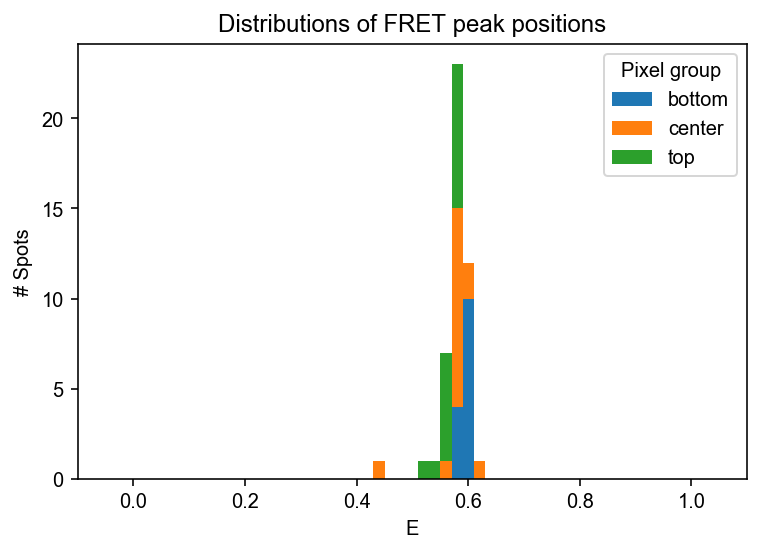

In [71]:
binwidth = 0.02
bins= np.arange(-0.1, 1.1, binwidth) + 0.5*binwidth
labels = sorted(set(FRET_peak.Pixel))
Efret_groups = [np.array(FRET_peak.E[FRET_peak.Pixel == grp]) for grp in labels]

plt.hist(Efret_groups, bins=bins, range=(bins.min(), bins.max()), histtype='bar', stacked=True);
plt.xlabel('E')
plt.ylabel('# Spots')
plt.xlim(-0.1, 1.1)
plt.title('Distributions of FRET peak positions')
plt.legend(labels, title='Pixel group')
print('FRET pop: E mean [min, max] = %5.3f [%5.3f, %5.3f], σ = %5.3f' % 
      (FRET_peak.E.mean(), FRET_peak.E.min(), FRET_peak.E.max(), FRET_peak.E.std()))
savefig('FRET_peaks_distributions_grouped.png')

FRET pop: S mean [min, max] = 0.789 [0.756, 0.831], σ = 0.017
Saved: figures/2017-05-23_08_12d_S_peaks_distributions_grouped.png.png
Saved hires: figures/2017-05-23_08_12d_S_peaks_distributions_grouped_highres.png


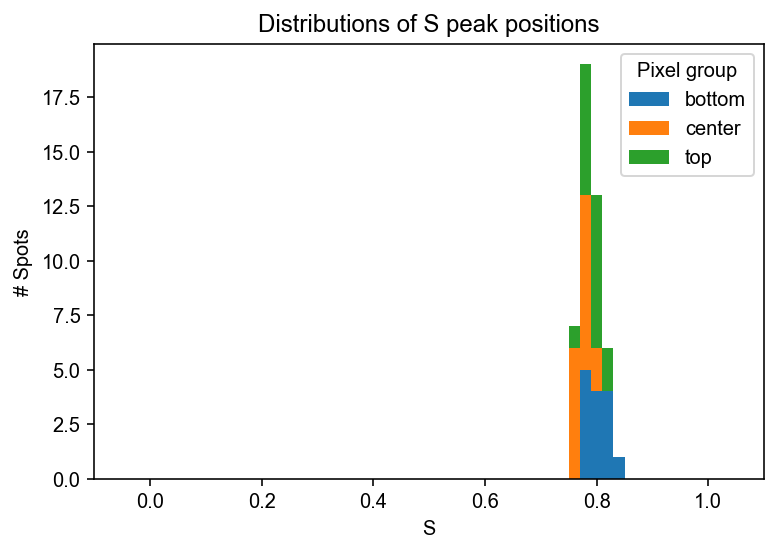

In [72]:
binwidth = 0.02
bins= np.arange(-0.1, 1.1, binwidth) + 0.5*binwidth
labels = sorted(set(FRET_peak.Pixel))
Sfret_groups = [np.array(FRET_peak.S[FRET_peak.Pixel == grp]) for grp in labels]

plt.hist(Sfret_groups, bins=bins, range=(bins.min(), bins.max()), histtype='bar', stacked=True);
plt.xlabel('S')
plt.ylabel('# Spots')
plt.xlim(-0.1, 1.1)
plt.title('Distributions of S peak positions')
plt.legend(labels, title='Pixel group')
print('FRET pop: S mean [min, max] = %5.3f [%5.3f, %5.3f], σ = %5.3f' % 
      (FRET_peak.S.mean(), FRET_peak.S.min(), FRET_peak.S.max(), FRET_peak.S.std()))
savefig('S_peaks_distributions_grouped.png')

FRET pop: Su mean [min, max] = 0.544 [0.521, 0.589], σ = 0.013
Saved: figures/2017-05-23_08_12d_Su_peaks_distributions_grouped.png.png
Saved hires: figures/2017-05-23_08_12d_Su_peaks_distributions_grouped_highres.png


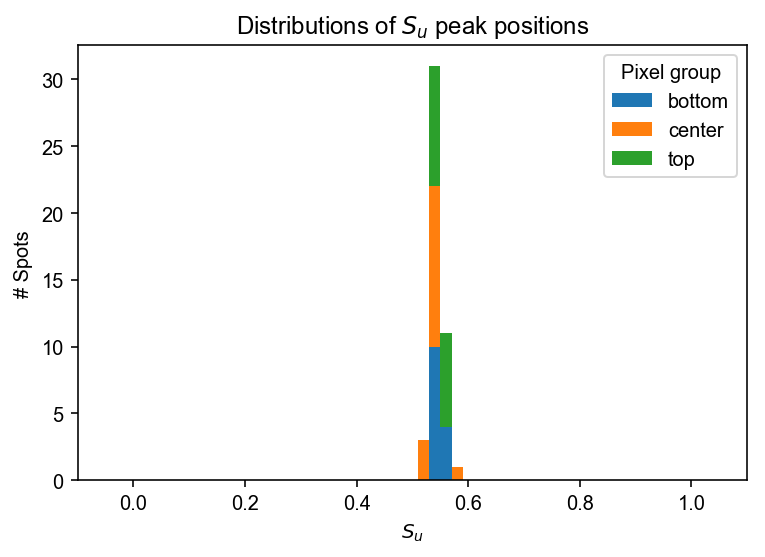

In [73]:
binwidth = 0.02
bins= np.arange(-0.1, 1.1, binwidth) + 0.5*binwidth
labels = sorted(set(FRET_peak.Pixel))
Sufret_groups = [np.array(FRET_peak.Su[FRET_peak.Pixel == grp]) for grp in labels]

plt.hist(Sufret_groups, bins=bins, range=(bins.min(), bins.max()), histtype='bar', stacked=True);
plt.xlabel('$S_u$')
plt.ylabel('# Spots')
plt.xlim(-0.1, 1.1)
plt.title('Distributions of $S_u$ peak positions')
plt.legend(labels, title='Pixel group')
print('FRET pop: Su mean [min, max] = %5.3f [%5.3f, %5.3f], σ = %5.3f' % 
      (FRET_peak.Su.mean(), FRET_peak.Su.min(), FRET_peak.Su.max(), FRET_peak.Su.std()))
savefig('Su_peaks_distributions_grouped.png')

In [74]:
num_bursts = FRET_peak.num_bursts
x = FRET_peak.index
y = FRET_peak.E
yerr = np.array(Efret_fitt.query('name == "sigma"')['value']) / np.sqrt(num_bursts)
sort = num_bursts.argsort()

Saved: figures/2017-05-23_08_12d_E_fit_vs_num_bursts.png
Saved hires: figures/2017-05-23_08_12d_E_fit_vs_num_bursts_highres.png


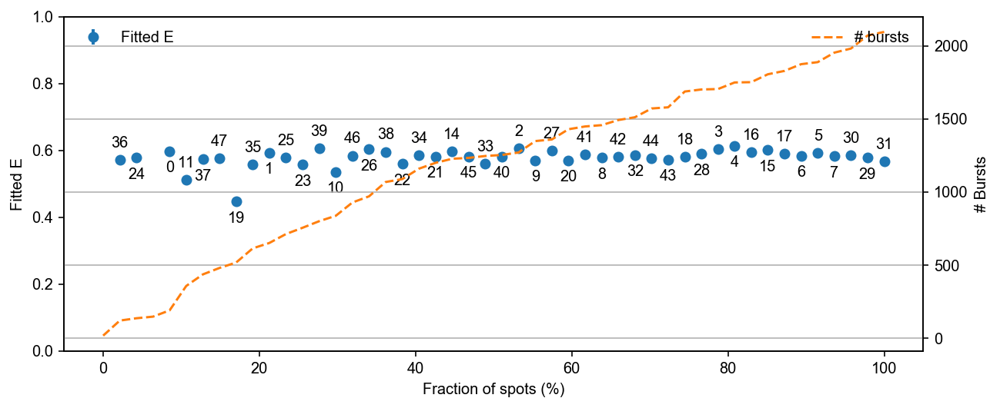

In [75]:
plt.figure(figsize=(10, 4))
x = FRET_peak.index / FRET_peak.index.max() * 100
y = FRET_peak.E
yerr = FRET_peak.E_err
plt.errorbar(x, y.loc[sort], yerr.loc[sort], lw=0, elinewidth=2, marker='o', label='Fitted E')
plt.xlabel('Fraction of spots (%)')
plt.ylabel('Fitted E')
plt.ylim(0, 1)
plt.legend(frameon=False, loc='upper left')
delta = 0.05
for ich, (spot, yi, xi) in enumerate(zip(np.arange(48)[sort], y.loc[sort], x)):
    delta *= -1
    plt.annotate('%d' % spot, (xi, yi + delta), ha='center', va='center')
ax2 = plt.twinx()
ax2.plot(x, num_bursts[sort], color='C1', ls='--', label='# bursts')
ax2.set_ylabel('# Bursts')
ax2.grid(True)
plt.legend(frameon=False, loc='upper right');
savefig('E fit vs num_bursts')

In [76]:
y = np.array(FRET_peak.E).reshape(4, 12)
yerr = np.array(FRET_peak.E_err).reshape(4, 12)
x = np.arange(12)

Saved: figures/2017-05-23_08_12d_Fitted_E_vs_Pixel_Column.png
Saved hires: figures/2017-05-23_08_12d_Fitted_E_vs_Pixel_Colum_highres.png


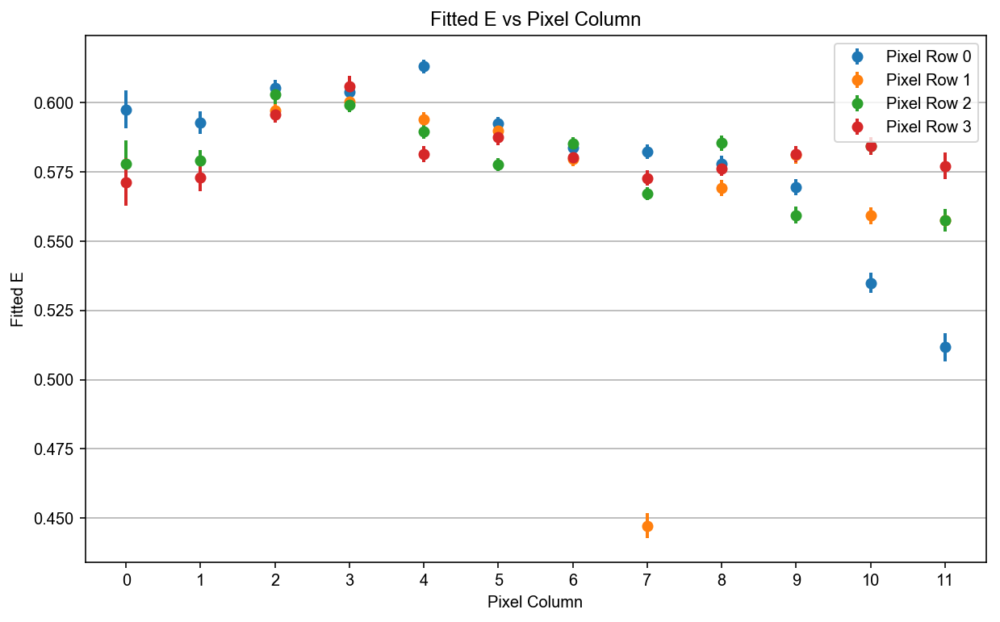

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6), squeeze=True, sharex=True, sharey=True)
for irow  in range(4):
    ax.errorbar(x, y[irow], yerr[irow], lw=0, elinewidth=2, marker='o', label='Pixel Row %d' % irow)
ax.set_xticks(range(0, 12, 1))
ax.set_ylabel('Fitted E')
ax.set_xlabel('Pixel Column')
plt.legend()
plt.grid(True, axis='y')
plt.title('Fitted E vs Pixel Column')
savefig('Fitted E vs Pixel Column')

(0, 1)

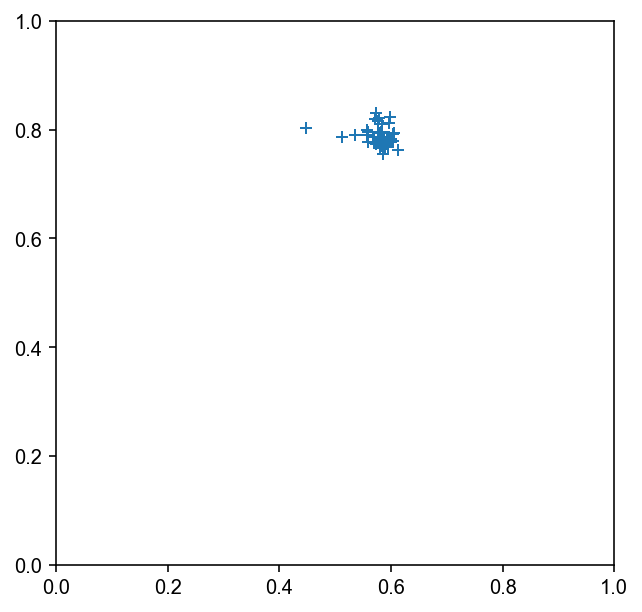

In [78]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(FRET_peak.E, FRET_peak.S, lw=0, marker='+', mew=1, label='FRET peak')
#ax.plot(FRET_peak.E, FRET_peak.S, lw=0, marker='o', label='FRET peak')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

### D-only population fit

In [79]:
ddo = d.copy()

Deep copy executed.


In [80]:
ddo.burst_search(min_rate_cps=50e3, pax=True, ph_sel=Ph_sel(Dex='Dem', Aex='Dem'))

 - Performing burst search (verbose=False) ... - Fixing  burst data to refer to ph_times_m ... [DONE]
[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]


In [81]:
ds_dox = ddo.select_bursts(select_bursts.size, ph_sel=Ph_sel(Dex='Dem', Aex='Dem'),
                           th1 = 40)
ds_do2 = ds_dox.select_bursts(select_bursts.size, 
                              ph_sel=Ph_sel(Aex='Aem'), naa_aexonly=False,
                              th2=4, th1=-10)

Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds_do2.nd, ds_do2.na, ds_do2.naa)]
ds_do2.add(Su=Su)

/home/anto/src/FRETBursts/fretbursts/mfit.py:329: RuntimeWarning: invalid value encountered in true_divide
  self.hist_pdf /= self.hist_counts.sum(1)[:, np.newaxis]


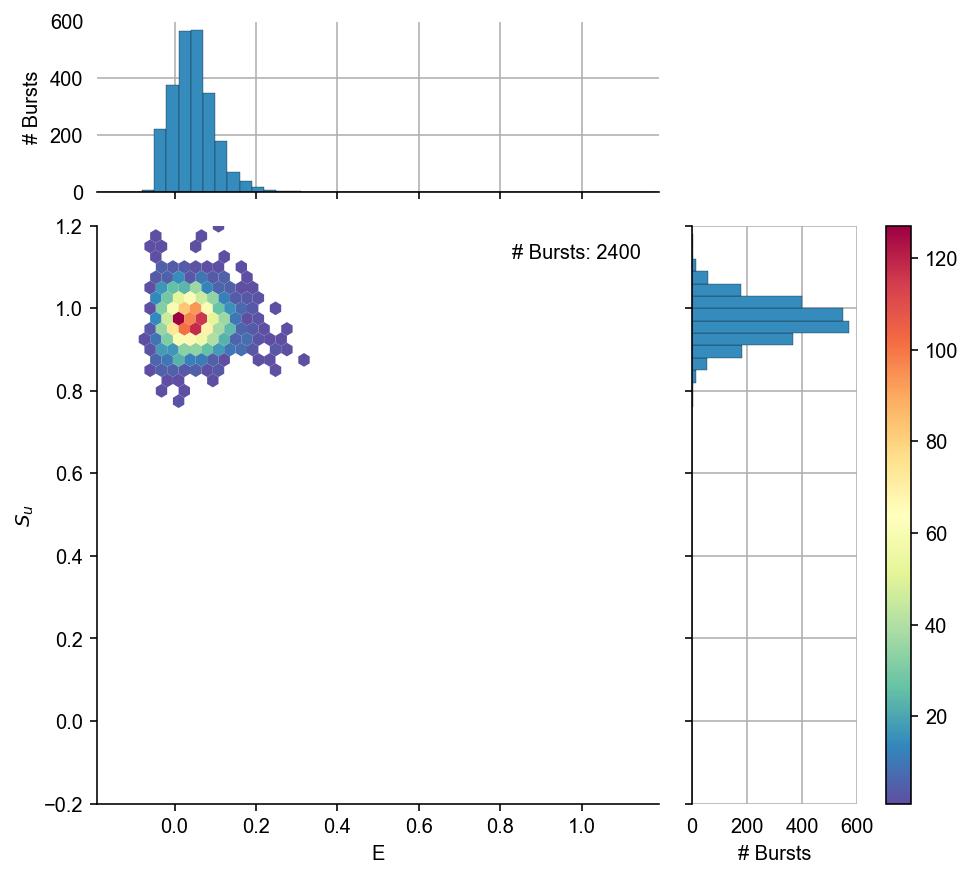

In [82]:
g = alex_jointplot(ds_do2, i=30, S_name='Su', vmax_fret=False, marginal_kws=dict(show_kde=False))
g.ax_joint.set_ylabel('$S_u$')

Saved: figures/2017-05-23_08_12d_48spot_alex_hist_Su_DonlyBS.png
Saved hires: figures/2017-05-23_08_12d_48spot_alex_hist_Su_DonlyBS_highres.png


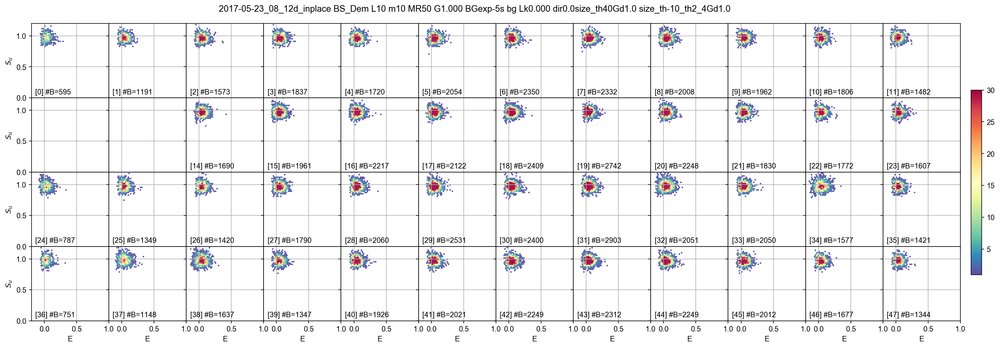

In [83]:
ax = dplot(ds_do2, hexbin_alex, vmax=30, S_name='Su', skip_ch=skip_ch, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
savefig('48spot alex hist Su DonlyBS')

In [84]:
ds_do = ds_do2

In [85]:
E_fitter = bext.bursts_fitter(ds_do, 'E', skip_ch=skip_ch)
model = mfit.factory_gaussian()
model.set_param_hint('center', value=0.05, min=-0.2, max=0.4)
model.set_param_hint('sigma', value=0.1, min=0.03, max=0.2)
model.print_param_hints()

Name          Value      Min      Max     Vary    Expr    
amplitude         1     -inf      inf     True    
center         0.05     -0.2      0.4     True    
fwhm            nan     -inf      inf     True    2.3548200*sigma
height          nan     -inf      inf     True    0.3989423*amplitude/max(1.e-15, sigma)
sigma           0.1     0.03      0.2     True    


In [86]:
E_fitter.fit_histogram(model, pdf=False, method='mealder')

/home/anto/src/FRETBursts/fretbursts/mfit.py:329: RuntimeWarning: invalid value encountered in true_divide
  self.hist_pdf /= self.hist_counts.sum(1)[:, np.newaxis]


Saved: figures/2017-05-23_08_12d_DO_pop_-_E_hist_fit.png
Saved hires: figures/2017-05-23_08_12d_DO_pop_-_E_hist_fit_highres.png


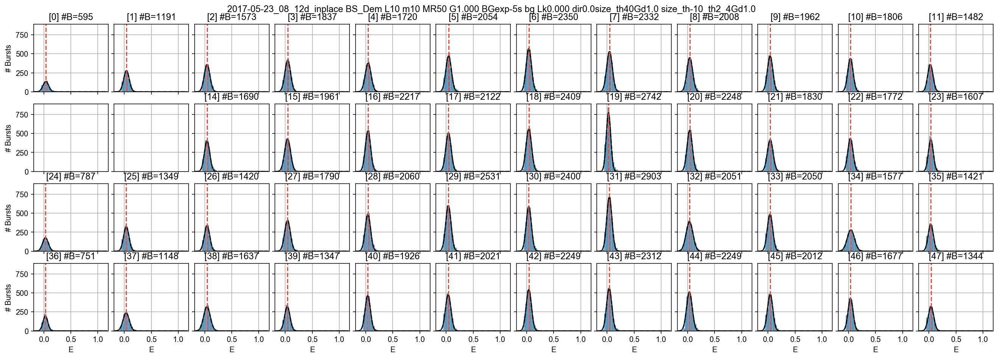

In [87]:
ax = dplot(ds_do, hist_fret, pdf=False, show_model=True, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts')
savefig('DO pop - E hist fit')

In [88]:
S_fitter = bext.bursts_fitter(ds_do, 'S', skip_ch=skip_ch)
model = mfit.factory_gaussian()
model.set_param_hint('center', value=0.9, min=0, max=1.1)
model.set_param_hint('sigma', value=0.1, min=0.03, max=0.3)
model.print_param_hints()

Name          Value      Min      Max     Vary    Expr    
amplitude         1     -inf      inf     True    
center          0.9        0      1.1     True    
fwhm            nan     -inf      inf     True    2.3548200*sigma
height          nan     -inf      inf     True    0.3989423*amplitude/max(1.e-15, sigma)
sigma           0.1     0.03      0.3     True    


In [89]:
S_fitter.fit_histogram(model, pdf=False, method='mealder')

/home/anto/src/FRETBursts/fretbursts/mfit.py:329: RuntimeWarning: invalid value encountered in true_divide
  self.hist_pdf /= self.hist_counts.sum(1)[:, np.newaxis]


Saved: figures/2017-05-23_08_12d_DO_pop_-_S_hist_fit.png
Saved hires: figures/2017-05-23_08_12d_DO_pop_-_S_hist_fit_highres.png


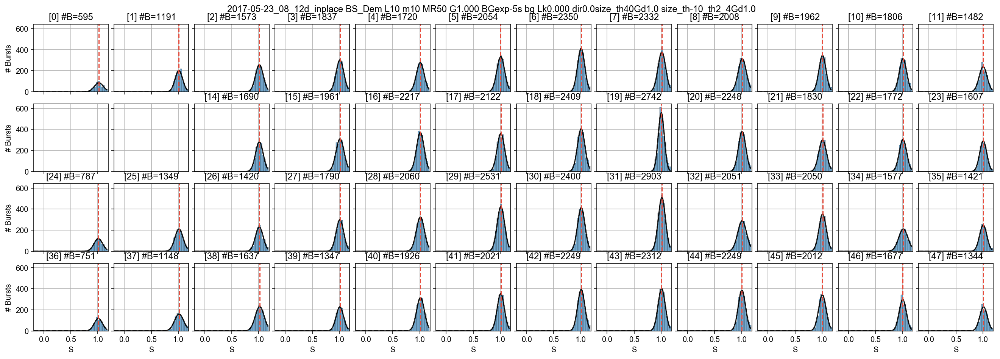

In [90]:
ax = dplot(ds_do, hist_S, pdf=False, show_model=True, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts')
savefig('DO pop - S hist fit');

In [91]:
Su_fitter = bext.bursts_fitter(ds_do, 'Su', skip_ch=skip_ch)
model = mfit.factory_gaussian()
model.set_param_hint('center', value=0.9, min=0, max=1.2)
model.set_param_hint('sigma', value=0.1, min=0.03, max=0.2)
model.print_param_hints()

Name          Value      Min      Max     Vary    Expr    
amplitude         1     -inf      inf     True    
center          0.9        0      1.2     True    
fwhm            nan     -inf      inf     True    2.3548200*sigma
height          nan     -inf      inf     True    0.3989423*amplitude/max(1.e-15, sigma)
sigma           0.1     0.03      0.2     True    


In [92]:
Su_fitter.fit_histogram(model, pdf=False, method='mealder')

/home/anto/src/FRETBursts/fretbursts/mfit.py:329: RuntimeWarning: invalid value encountered in true_divide
  self.hist_pdf /= self.hist_counts.sum(1)[:, np.newaxis]


Saved: figures/2017-05-23_08_12d_DO_pop_-_Su_hist_fit.png
Saved hires: figures/2017-05-23_08_12d_DO_pop_-_Su_hist_fit_highres.png


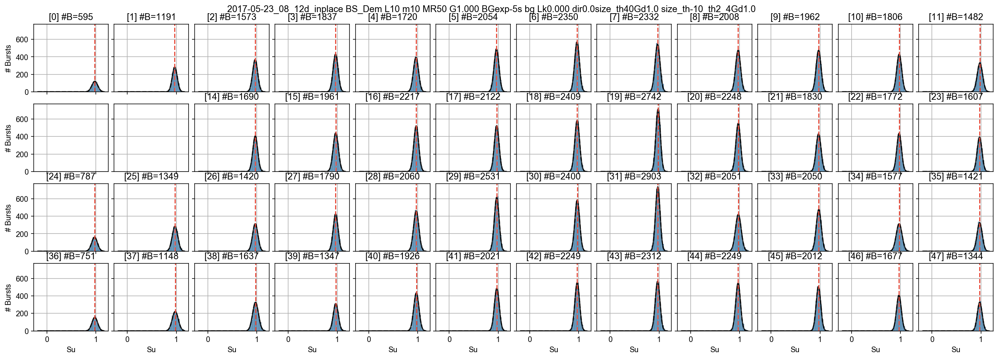

In [93]:
ax = dplot(ds_do, hist_burst_data, data_name='Su', pdf=False, show_model=True, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts')
savefig('DO pop - Su hist fit');

### D-only population tidy

In [94]:
Edo_fitg = br.glance(E_fitter.fit_res, var_names='spot')
Sdo_fitg = br.glance(S_fitter.fit_res, var_names='spot')
Sudo_fitg = br.glance(Su_fitter.fit_res, var_names='spot')

In [95]:
Edo_fitg.head(3)

,model,method,num_params,num_data_points,chisqr,redchi,AIC,BIC,num_func_eval,success,message,spot
0,Model(gaussian),Nelder-Mead,3,46,1893.255577,44.029199,177.000941,182.486865,214,True,Optimization terminated successfully.,0
1,Model(gaussian),Nelder-Mead,3,46,3563.370168,82.869074,206.091750,211.577674,219,True,Optimization terminated successfully.,1
2,Model(gaussian),Nelder-Mead,3,46,2233.110859,51.932811,184.595437,190.081361,232,True,Optimization terminated successfully.,2


In [96]:
Sdo_fitg.head(3)

,model,method,num_params,num_data_points,chisqr,redchi,AIC,BIC,num_func_eval,success,message,spot
0,Model(gaussian),Nelder-Mead,3,46,1233.944620,28.696387,157.309177,162.795101,217,True,Optimization terminated successfully.,0
1,Model(gaussian),Nelder-Mead,3,46,4192.648200,97.503447,213.572536,219.058461,242,True,Optimization terminated successfully.,1
2,Model(gaussian),Nelder-Mead,3,46,993.674944,23.108720,147.347362,152.833286,257,True,Optimization terminated successfully.,2


In [97]:
Sudo_fitg.head(3)

,model,method,num_params,num_data_points,chisqr,redchi,AIC,BIC,num_func_eval,success,message,spot
0,Model(gaussian),Nelder-Mead,3,46,225.957813,5.254833,79.218518,84.704442,174,True,Optimization terminated successfully.,0
1,Model(gaussian),Nelder-Mead,3,46,570.837853,13.275299,121.849335,127.335259,220,True,Optimization terminated successfully.,1
2,Model(gaussian),Nelder-Mead,3,46,949.197205,22.074354,145.240858,150.726783,217,True,Optimization terminated successfully.,2


In [98]:
Edo_fitt = br.tidy(E_fitter.fit_res, var_names='spot')
Sdo_fitt = br.tidy(S_fitter.fit_res, var_names='spot')
Sudo_fitt = br.tidy(Su_fitter.fit_res, var_names='spot')
Edo_fitt.head()

,name,value,min,max,vary,expr,stderr,init_value,spot
0,amplitude,17.827959,-inf,inf,True,None,NaN,1.00,0
1,center,0.036089,-0.200000,0.400000,True,None,NaN,0.05,0
2,fwhm,0.123111,-inf,inf,False,2.3548200*sigma,NaN,NaN,0
3,height,136.042140,-inf,inf,False,"0.3989423*amplitude/max(1.e-15, sigma)",NaN,NaN,0
4,sigma,0.052280,0.030000,0.200000,True,None,NaN,0.10,0


In [99]:
DO_peak = make_ES_fit_dataframe(Edo_fitt, Sdo_fitt, Sudo_fitt, ds_do)

In [100]:
DO_peak.head()

,E,S,Su,num_bursts,E_sigma,S_sigma,Su_sigma,E_err,S_err,Su_err,Pixel
spot,,,,,,,,,,,
0,0.036089,1.018768,0.977282,595,0.052280,0.082869,0.060034,0.002143,0.003397,0.002461,bottom
1,0.039234,1.009935,0.966784,1191,0.051071,0.069725,0.050354,0.001480,0.002020,0.001459,bottom
2,0.042177,1.010822,0.965771,1573,0.052378,0.072024,0.050893,0.001321,0.001816,0.001283,bottom
3,0.045341,1.012972,0.965375,1837,0.052472,0.070869,0.050725,0.001224,0.001653,0.001184,bottom
4,0.044922,1.010320,0.963405,1720,0.054656,0.072201,0.052182,0.001318,0.001741,0.001258,center


### D-only population plots

DO pop  : E mean [min, max] = 0.038 [0.025, 0.045], σ = 0.005
FRET pop: E mean [min, max] = 0.578 [0.447, 0.613], σ = 0.027
Saved: figures/2017-05-23_08_12d_FRET_vs_DO_peaks_distributions_grouped.png.png
Saved hires: figures/2017-05-23_08_12d_FRET_vs_DO_peaks_distributions_grouped_highres.png


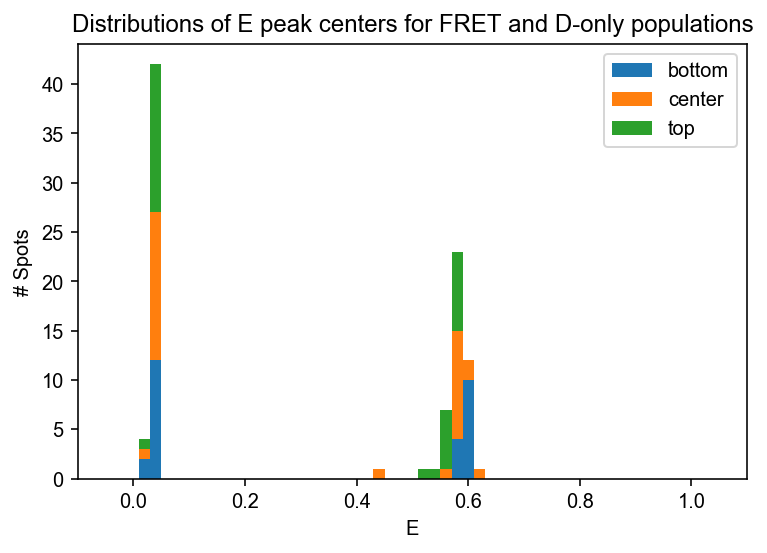

In [101]:
binwidth = 0.02
bins= np.arange(-0.1, 1.1, binwidth) + 0.5*binwidth
labels = sorted(set(DO_peak.Pixel))
Edo_groups = [np.array(DO_peak.E[DO_peak.Pixel == grp]) for grp in labels]

plt.hist(Edo_groups, bins=bins, histtype='bar', range=(bins.min(), bins.max()), stacked=True);
plt.hist(Efret_groups, bins=bins, histtype='bar', range=(bins.min(), bins.max()), stacked=True, color=('C0', 'C1', 'C2'));

plt.xlabel('E')
plt.ylabel('# Spots')
plt.xlim(-0.1, 1.1)
plt.title('Distributions of E peak centers for FRET and D-only populations')
plt.legend(labels)
print('DO pop  : E mean [min, max] = %5.3f [%5.3f, %5.3f], σ = %5.3f' % 
      (DO_peak.E.mean(), DO_peak.E.min(), DO_peak.E.max(), DO_peak.E.std()))
print('FRET pop: E mean [min, max] = %5.3f [%5.3f, %5.3f], σ = %5.3f' % 
      (FRET_peak.E.mean(), FRET_peak.E.min(), FRET_peak.E.max(), FRET_peak.E.std()))
savefig('FRET_vs_DO_peaks_distributions_grouped.png')

FRET pop: Su mean [min, max] = 0.544 [0.521, 0.589], σ = 0.013
DO      : Su mean [min, max] = 0.970 [0.963, 0.978], σ = 0.004
Saved: figures/2017-05-23_08_12d_Su_peaks_distributions_grouped.png.png
Saved hires: figures/2017-05-23_08_12d_Su_peaks_distributions_grouped_highres.png


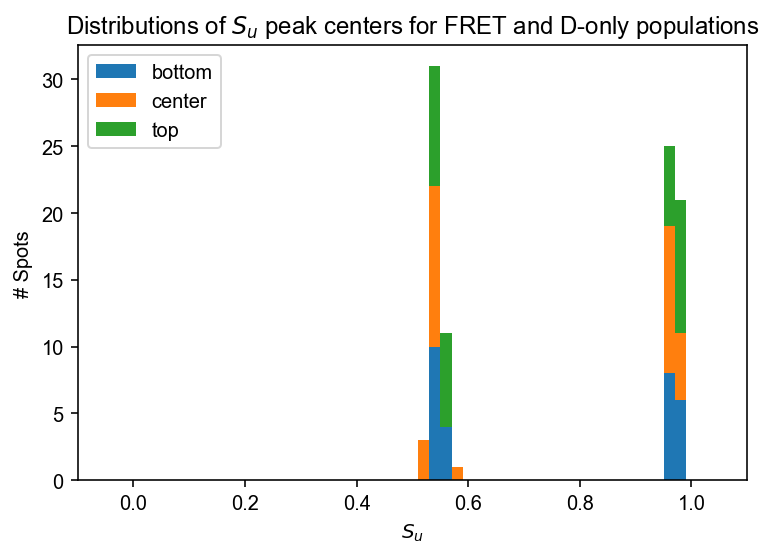

In [102]:
binwidth = 0.02
bins= np.arange(-0.1, 1.1, binwidth) + 0.5*binwidth
labels = sorted(set(DO_peak.Pixel))
Sudo_groups = [np.array(DO_peak.Su[DO_peak.Pixel == grp]) for grp in labels]

plt.hist(Sudo_groups, bins=bins, histtype='bar', range=(bins.min(), bins.max()), stacked=True);
plt.hist(Sufret_groups, bins=bins, histtype='bar', range=(bins.min(), bins.max()), stacked=True, color=('C0', 'C1', 'C2'));
plt.xlabel('$S_u$')
plt.ylabel('# Spots')
plt.xlim(-0.1, 1.1)
plt.title('Distributions of $S_u$ peak centers for FRET and D-only populations')
plt.legend(labels)
print('FRET pop: Su mean [min, max] = %5.3f [%5.3f, %5.3f], σ = %5.3f' % 
      (FRET_peak.Su.mean(), FRET_peak.Su.min(), FRET_peak.Su.max(), FRET_peak.Su.std()))
print('DO      : Su mean [min, max] = %5.3f [%5.3f, %5.3f], σ = %5.3f' % 
      (DO_peak.Su.mean(), DO_peak.Su.min(), DO_peak.Su.max(), DO_peak.Su.std()))
savefig('Su_peaks_distributions_grouped.png')

Saved: figures/2017-05-23_08_12d_FRET_vs_DO_fitted_Epr-S_peak_position.png
Saved hires: figures/2017-05-23_08_12d_FRET_vs_DO_fitted_Epr-S_peak_positio_highres.png


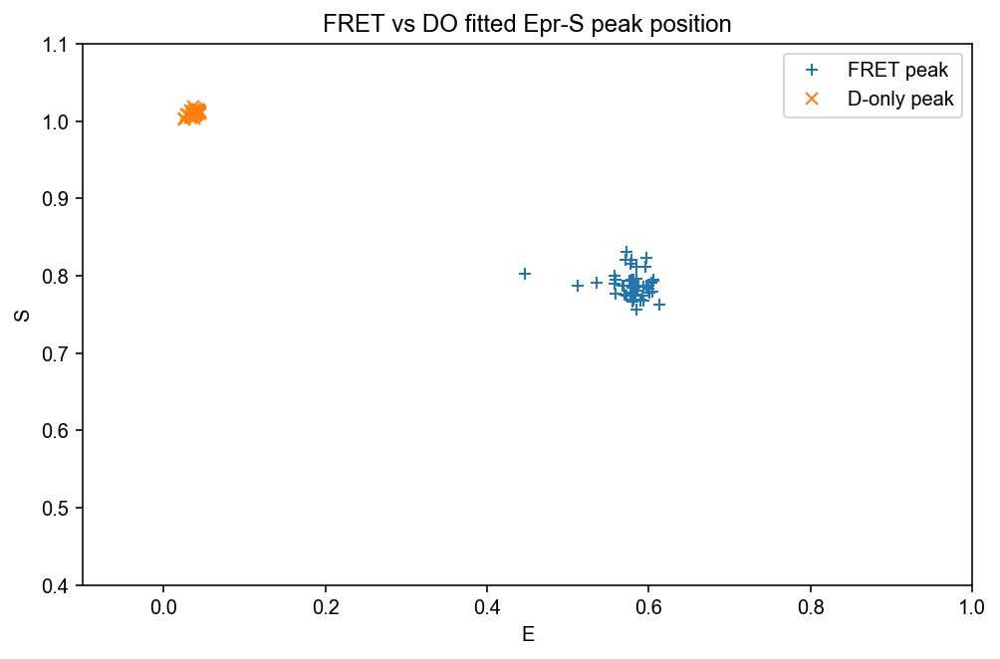

In [103]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(FRET_peak.E, FRET_peak.S, lw=0, marker='+', mew=1, label='FRET peak')
ax.plot(DO_peak.E, DO_peak.S, lw=0, marker='x', mew=1, label='D-only peak')
ax.set_xlim(-0.1, 1)
ax.set_ylim(0.4, 1.1)
plt.setp(ax, xlabel='E', ylabel='S')
plt.title('FRET vs DO fitted Epr-S peak position')
plt.legend()
savefig('FRET vs DO fitted Epr-S peak position')

Saved: figures/2017-05-23_08_12d_FRET_vs_DO_fitted_Epr-Su_peak_position.png
Saved hires: figures/2017-05-23_08_12d_FRET_vs_DO_fitted_Epr-Su_peak_positio_highres.png


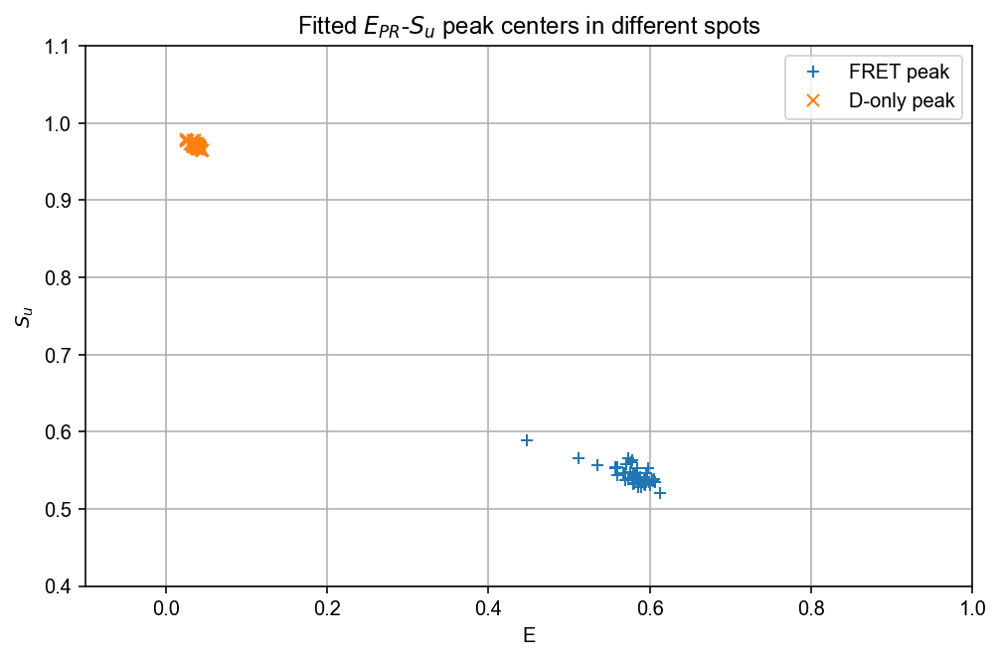

In [104]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(FRET_peak.E, FRET_peak.Su, lw=0, marker='+', mew=1, label='FRET peak')
ax.plot(DO_peak.E, DO_peak.Su, lw=0, marker='x', mew=1, label='D-only peak')
ax.set_xlim(-0.1, 1)
ax.set_ylim(0.4, 1.1)
plt.setp(ax, xlabel='E', ylabel='$S_u$')
plt.title('Fitted $E_{PR}$-$S_u$ peak centers in different spots')
plt.legend()
plt.grid()
savefig('FRET vs DO fitted Epr-Su peak position')

# Global plots

In [105]:
def figure48(figsize=(18, 6), annotate=True, sharex=True, sharey=True,
             text_fmt='%d', text_x=0.85, text_y=0.9, text_data=spotsh, text_va='top', text_ha='right', ):
    fig, axes = plt.subplots(4, 12, figsize=figsize, sharex=sharex, sharey=sharey)
    plt.subplots_adjust(hspace=0, wspace=0)
    if annotate:
        for irow, axrow in enumerate(axes):
            for icol, ax in enumerate(axrow):
                ax.text(text_x, text_y, text_fmt % text_data[irow, icol], 
                        transform=ax.transAxes, ha=text_ha, va=text_va)
    return fig, axes

In [106]:
err_kws = dict(capsize=6, capthick=1.5, marker='o', ms=6)

In [107]:
x = np.array(FRET_peak.E).reshape(4, 12)
xerr = np.array(FRET_peak.E_sigma).reshape(4, 12)
y = np.array(FRET_peak.Su).reshape(4, 12)
yerr = np.array(FRET_peak.Su_sigma).reshape(4, 12)
xmean = np.nanmean(x)
ymean = np.nanmean(y)
delta = np.max([np.nanmax(yerr), np.nanmax(xerr)])*1.5

Saved: figures/2017-05-23_08_12d_48-spot_Epr-Su_peak_position_deviation_from_mean.png
Saved hires: figures/2017-05-23_08_12d_48-spot_Epr-Su_peak_position_deviation_from_mea_highres.png


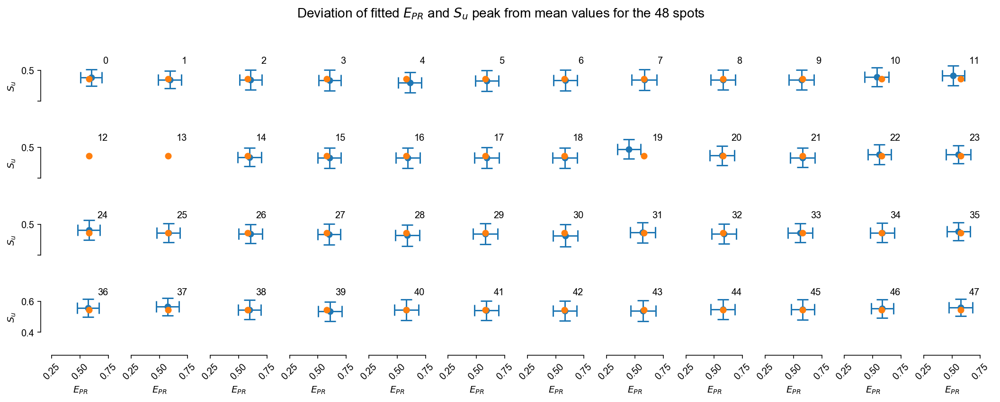

In [108]:
fig, axes = figure48(text_x=0.85, text_y=0.88, text_ha='right', sharey=False)
for irow, axrow in enumerate(axes):
    for icol, ax in enumerate(axrow):
        ax.errorbar(x[irow, icol], y[irow, icol], xerr=xerr[irow,icol], yerr=yerr[irow,icol], **err_kws)
        ax.plot(xmean, ymean, marker='o', zorder=10)
        sns.despine(left=True, bottom=True)
#plt.setp(axes[0], xlim=(np.round(xmean - delta, 1), np.round(xmean + delta, 1)));
#plt.setp(axes[:,0], ylim=(ymean - delta, ymean + delta));
plt.setp(axes[0], xlim=(0.15, 0.85));
plt.setp(axes.ravel(), ylim=(0.25, 0.75));
plt.setp(axes[-1], xlabel='$E_{PR}$')
plt.setp(axes[:, 0], ylabel='$S_u$');
for ax in axes[-1]:
    sns.despine(bottom=False, left=True, trim=True, ax=ax)
    plt.setp(ax.get_xticklabels(), rotation=45)
for ax in axes[:, 0]:
    sns.despine(left=False, bottom=True, trim=True, ax=ax)
sns.despine(left=False, bottom=False, trim=True, ax=axes[-1,0])
for ax in axes[:-1].ravel():
    ax.tick_params(bottom=False)
for ax in axes[:, 1:].ravel():
    ax.tick_params(left=False)
for ax in axes[:-1, 0]:
    ax.set_yticklabels([' ', '0.5', '0.75'])
for ax in axes[:, 1:].ravel():
    plt.setp(ax.get_yticklabels(), visible=False)
plt.suptitle('Deviation of fitted $E_{PR}$ and $S_u$ peak from mean values for the 48 spots', fontsize=14, va='top');
savefig('48-spot Epr-Su peak position deviation from mean')

# Calibration

For convenience we reporte the formula for the relative-$\gamma$ factor $\chi_{ch}$
and the expression of $E$ as a function of $E_{PR}$:

$$
\chi_{ch} = \frac{\frac{1}{\langle E_{PR\,ch} \rangle_{ch}} - 1}{\frac{1}{E_{PR\,ch}} - 1} 
$$

$$
E = \frac{1}{1 + \gamma \left( \frac{1}{E_{PR}} - 1 \right)}
$$

In [109]:
chi_ch = (1/FRET_peak.E.mean() - 1) / (1/FRET_peak.E - 1)
E_corr = 1 / (1 + chi_ch * (1/FRET_peak.E - 1))
E_corr.head()

spot
0    0.578116
1    0.578116
2    0.578116
3    0.578116
4    0.578116
Name: E, dtype: float64

In [110]:
assert (E_corr.max() - E_corr.min()) < 1e-9  # Test that E_corr are all "equal"

In [111]:
ds_fret.num_bursts

array([ 190,  651, 1270, 1704, 1749, 1888, 1874, 1953, 1457, 1348,  837,
        357,   17,  147, 1227, 1805, 1751, 1828, 1687,  517, 1429, 1199,
       1088,  755,  136,  712,  970, 1359, 1701, 2070, 1981, 2095, 1511,
       1246, 1159,  614,  120,  436, 1068,  800, 1253, 1448, 1492, 1579,
       1571, 1233,  928,  480])

In [112]:
ds_fret.chi_ch = np.ones(48)

In [113]:
bursts0 = bext.burst_data(ds_fret)
bursts0.shape

(56690, 13)

In [114]:
ds_fret.chi_ch = chi_ch

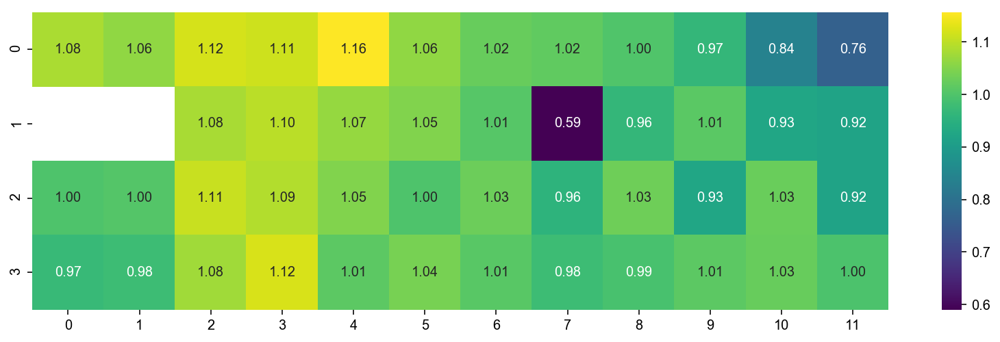

In [115]:
heatmap48(chi_ch, annot=True, fmt='.2f')

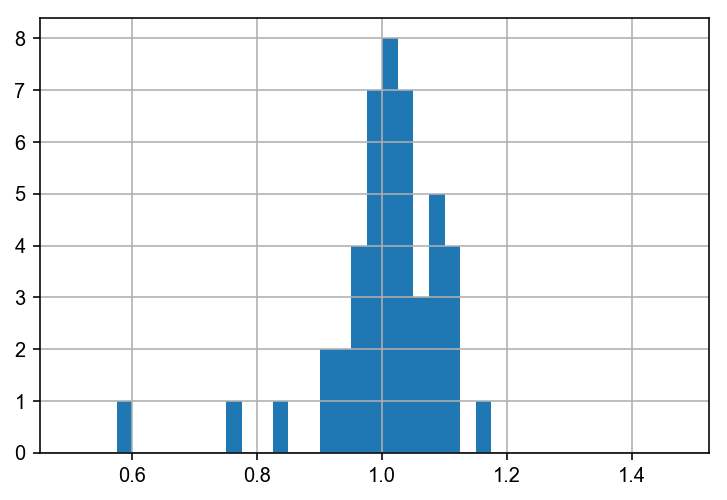

In [116]:
chi_ch.hist(bins=np.arange(0.5, 1.5, 0.025))

In [117]:
bursts = bext.burst_data(ds_fret)
bursts.shape

(56690, 13)

Saved: figures/2017-05-23_08_12d_48-spot_calibration.png
Saved hires: figures/2017-05-23_08_12d_48-spot_calibratio_highres.png


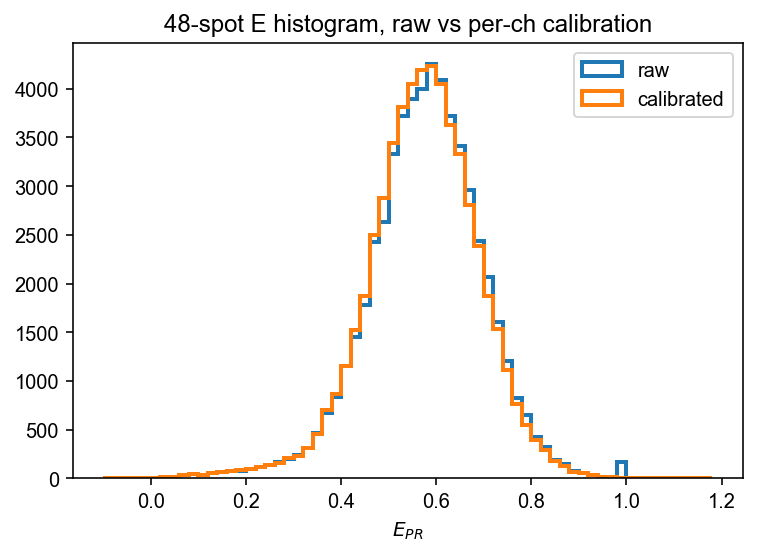

In [118]:
#plt.rcParams['font.size'] = 12
kw = dict(bins=np.arange(-0.1,1.2, 0.02), histtype='step', lw=2, range=(-0.1, 1.1))
plt.hist(bursts0.E, label='raw', **kw);
plt.hist(bursts.E, label='calibrated', **kw);
plt.legend();
plt.title('48-spot E histogram, raw vs per-ch calibration');
plt.xlabel('$E_{PR}$')
savefig('48-spot calibration')
#plt.rcParams['font.size'] = 14

In [119]:
bursts.head()

,E,S,na,naa,nar,nd,nda,nt,size_raw,t_start,t_stop,width_ms,spot
0,0.666112,0.961918,22.302332,23.627841,22.302332,8.455060,12.179086,66.564318,78,1.142507,1.143522,1.015075,0
1,0.513839,0.832198,14.544859,20.252442,14.544859,11.818628,13.582079,60.198007,70,4.815406,4.816276,0.870062,0
2,0.483153,0.663111,17.710789,36.334000,17.710789,21.591937,13.378348,89.015073,104,5.892520,5.893814,1.293387,0
3,0.719349,0.893774,25.061612,29.202318,25.061612,10.114225,7.933368,72.311523,85,7.231598,7.232693,1.095175,0
4,0.484838,0.796658,14.449046,22.055758,14.449046,16.759523,11.578504,64.842831,75,22.549843,22.550765,0.921950,0


In [120]:
ich = 33
chi_ch[ich]

0.9262258150397521

In [121]:
ds_fret.chi_ch = np.ones(48)

In [122]:
E0 = ds_fret.E[ich]

In [123]:
ds_fret.chi_ch = chi_ch

In [124]:
E = ds_fret.E[ich]

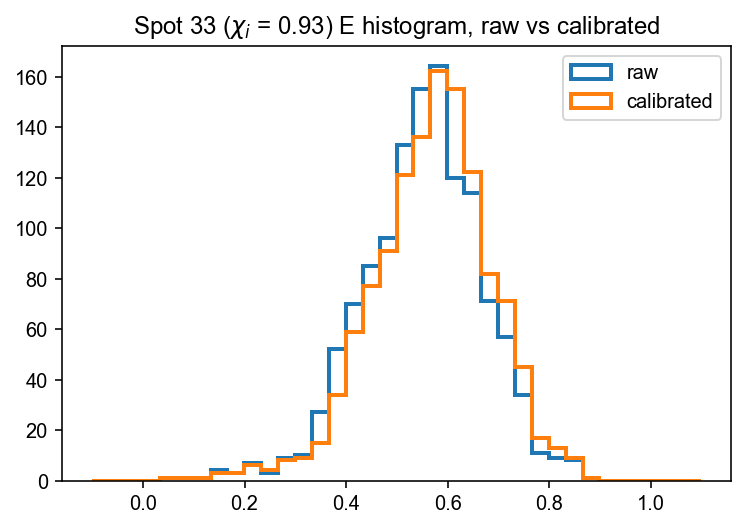

In [125]:
kw = dict(bins=np.arange(-0.1,1.1, 0.0333), histtype='step', lw=2)
plt.hist(E0, label='raw', **kw);
plt.hist(E, label='calibrated', **kw);
plt.legend();
plt.title('Spot %d ($\chi_i$ = %.2f) E histogram, raw vs calibrated' % (ich, chi_ch[ich]));

In [126]:
ich

33

In [127]:
E0i = bursts0.E.loc[bursts0.spot == ich]
Ei = bursts.E.loc[bursts.spot == ich]

In [128]:
E0a = bursts0.E.loc[~pd.isnull(bursts0.E)]
Ea = bursts.E.loc[~pd.isnull(bursts.E)]

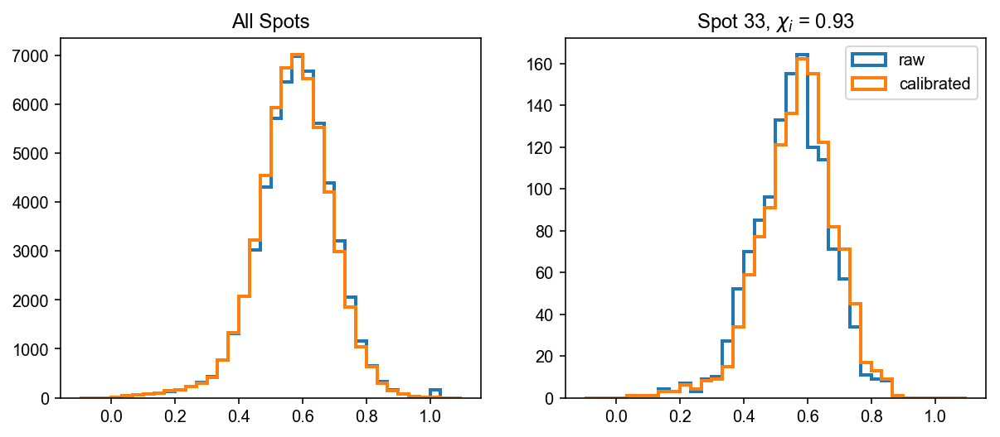

In [129]:
#plt.rcParams['font.size'] = 12
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 4))
kw = dict(bins=np.arange(-0.1,1.1, 0.0333), histtype='step', lw=2)
ax0.hist(E0a, label='raw', **kw);
ax0.hist(Ea, label='calibrated', **kw);

ax1.hist(E0i, label='raw', **kw);
ax1.hist(Ei, label='calibrated', **kw);
ax1.legend();
ax1.set_title('Spot %d, $\chi_i$ = %.2f' % (ich, chi_ch[ich]));
ax0.set_title('All Spots');

ax1.set_title('Spot %d, $\chi_i$ = %.2f' % (ich, chi_ch[ich]));
#plt.rcParams['font.size'] = 14

In [130]:
(bursts.spot == ich).sum()

1246

In [131]:
bursts.spot.shape

(56690,)

In [132]:
bursts0.E.loc[bursts.spot == ich].shape

(1246,)

In [133]:
E.shape, bursts.E.loc[bursts.spot == ich].shape

((1246,), (1246,))

In [134]:
bursts.sample(10).sort_index()

,E,S,na,naa,nar,nd,nda,nt,size_raw,t_start,t_stop,width_ms,spot
5253,0.457096,0.820906,19.576594,28.920242,19.576594,18.680967,21.536400,88.714203,96,1063.091436,1063.092548,1.111263,4
8071,0.505558,0.759712,28.047712,45.595032,28.047712,28.395438,25.194012,127.232194,139,321.619596,321.620895,1.298587,6
11990,0.555333,0.658958,15.210991,29.386989,15.210991,12.255811,12.113903,68.967693,78,526.122126,526.123100,0.974312,8
16346,0.533468,0.778521,17.806326,27.302061,17.806326,16.513662,12.285500,73.907550,81,935.701256,935.702321,1.064925,14
19752,0.562530,0.635527,25.441964,51.379953,25.441964,15.174486,21.907078,113.903482,123,910.809348,910.810656,1.308125,16
21987,0.482361,0.730526,14.143101,24.958772,14.143101,10.046010,18.892212,68.040096,73,1343.022539,1343.023319,0.780563,17
34021,0.571955,0.872572,16.649616,20.900747,16.649616,13.657234,11.311923,62.519520,74,167.304675,167.305444,0.769487,29
38471,0.612176,0.793354,16.734756,23.855139,16.734756,13.172105,9.005322,62.767322,71,399.170700,399.171537,0.836962,31
42188,0.484844,0.676854,14.062988,27.910773,14.062988,14.759097,17.505605,74.238463,80,930.429385,930.430219,0.833975,33
47205,0.494544,0.817071,23.785740,34.553747,23.785740,20.235518,27.724279,106.299283,120,357.544357,357.545799,1.441375,40


In [135]:
bursts.t_start.max()

1410.2265131249999

# Collapse

In [136]:
df = d.fuse_bursts(ms=0)

 - - - - - CHANNEL  1 - - - - 
 --> END Fused 15365 bursts (29.2%, 11 iter)

 - - - - - CHANNEL  2 - - - - 
 --> END Fused 16994 bursts (27.8%, 9 iter)

 - - - - - CHANNEL  3 - - - - 
 --> END Fused 19787 bursts (27.8%, 9 iter)

 - - - - - CHANNEL  4 - - - - 
 --> END Fused 22355 bursts (27.8%, 12 iter)

 - - - - - CHANNEL  5 - - - - 
 --> END Fused 21846 bursts (27.7%, 10 iter)

 - - - - - CHANNEL  6 - - - - 
 --> END Fused 24609 bursts (28.1%, 10 iter)

 - - - - - CHANNEL  7 - - - - 
 --> END Fused 24469 bursts (28.1%, 12 iter)

 - - - - - CHANNEL  8 - - - - 
 --> END Fused 33612 bursts (28.5%, 11 iter)

 - - - - - CHANNEL  9 - - - - 
 --> END Fused 23598 bursts (28.0%, 13 iter)

 - - - - - CHANNEL 10 - - - - 
 --> END Fused 19021 bursts (26.9%, 12 iter)

 - - - - - CHANNEL 11 - - - - 
 --> END Fused 16371 bursts (26.5%, 10 iter)

 - - - - - CHANNEL 12 - - - - 
 --> END Fused 15537 bursts (27.3%, 11 iter)

 - - - - - CHANNEL 13 - - - - 
 --> END Fused 3583 bursts (25.4%, 8 iter)

 - 

In [137]:
dc = d.collapse(update_gamma=False, skip_ch=skip_ch)  ## check that chi_ch is set to 1 here

In [138]:
d.num_bursts.sum()

3657181

In [139]:
def sel_raw_naa(d, ich=0, th1=20, th2=np.inf, gamma=1., beta=1., donor_ref=True):
    assert th1 <= th2, 'th1 (%.2f) must be <= of th2 (%.2f)' % (th1, th2)
    kws = dict(ich=ich, gamma=gamma, beta=beta, donor_ref=donor_ref)
    naa_term = d.naa[ich]
    bursts_mask = (naa_term >= th1) * (naa_term <= th2)
    return bursts_mask, ''

def sel_ndex_na(d, ich=0, th1=20, th2=np.inf, gamma=1):
    assert th1 <= th2, 'th1 (%.2f) must be <= of th2 (%.2f)' % (th1, th2)
    size = d.nd[ich] + d.nda[ich] + d.na[ich] / gamma
    bursts_mask = (size >= th1) * (size <= th2)
    return bursts_mask, ''

In [140]:
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=1,
                   na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d._burst_sizes_pax_formula(**naa_sel_kws))

<IPython.core.display.Math object>

In [141]:
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)

Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

In [142]:
dcs_th1 = d.select_bursts(select_bursts.size, th1=10, **naa_sel_kws)
dcs_th2 = dcs_th1.select_bursts(select_bursts.size, th1=20, **size_sel_kws)
dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)

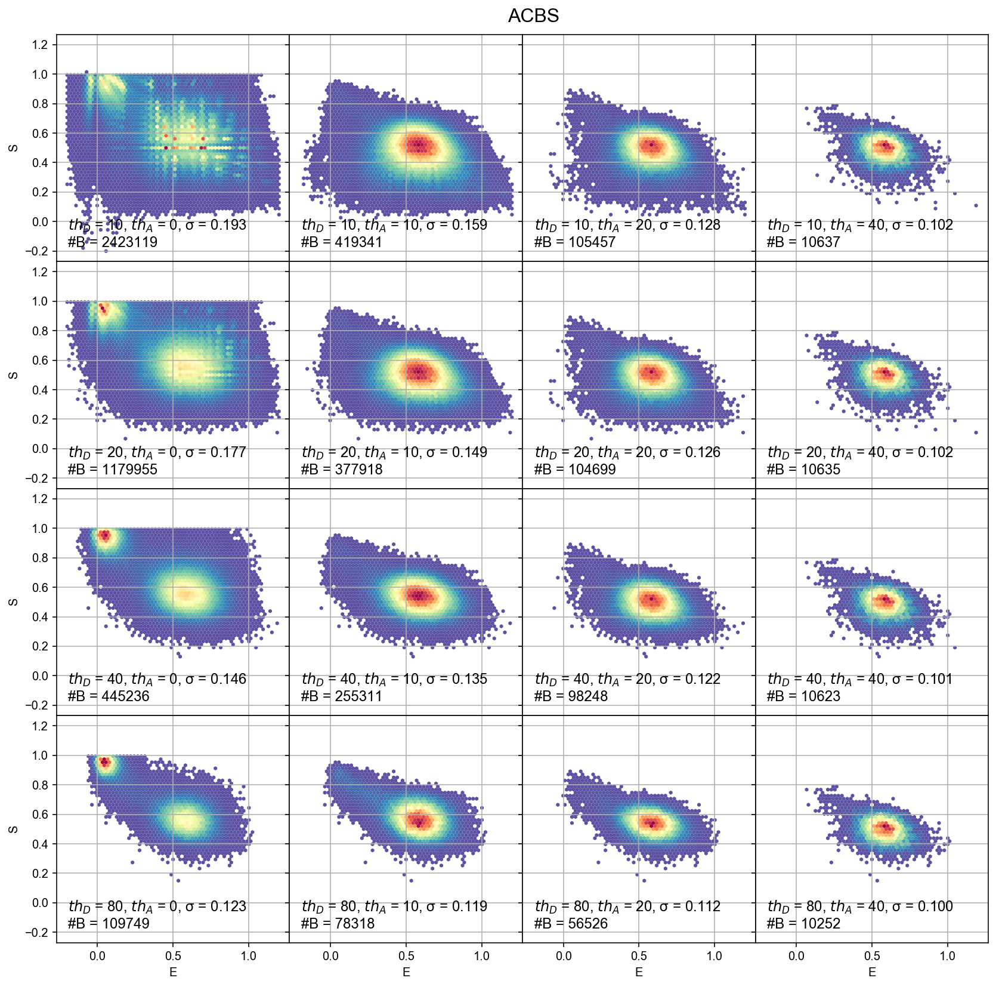

In [143]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        dcs_th1 = d.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dcs_th2 = dcs_th1.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs_th.nd, dcs_th.na, dcs_th.naa)]
        dcs_th.add(Su=Su)
        E = dcs_th.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcs_th, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcs_th.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'ACBS', transform=fig.transFigure, fontsize=16);

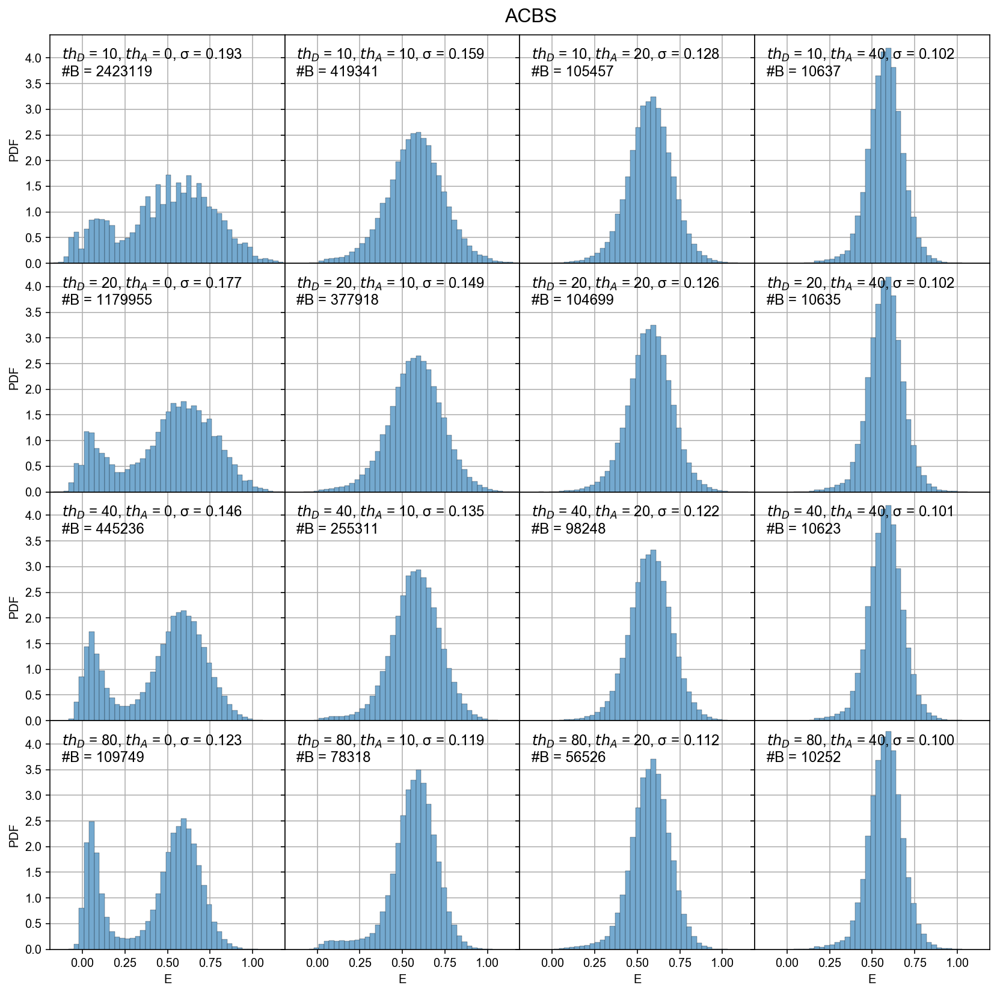

In [144]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        dcs_th1 = d.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dcs_th2 = dcs_th1.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
        dplot(dcs_th, hist_fret, ax=ax)
        E = dcs_th.E[0]
        E_std = E[E > 0.2].std()
        ax.text(0.05, 0.95, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcs_th.num_bursts), 
                va='top', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'ACBS', transform=fig.transFigure, fontsize=16)

In [145]:
d2 = bext.burst_search_and_gate(d, min_rate_cps=(50e3, 25e3))

Deep copy executed.
Deep copy executed.
Deep copy executed.
 - Performing burst search (verbose=False) ... - Fixing  burst data to refer to ph_times_m ... [DONE]
[DONE]
 - Calculating burst periods ...[DONE]
 - Performing burst search (verbose=False) ... - Fixing  burst data to refer to ph_times_m ... [DONE]
[DONE]
 - Calculating burst periods ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]


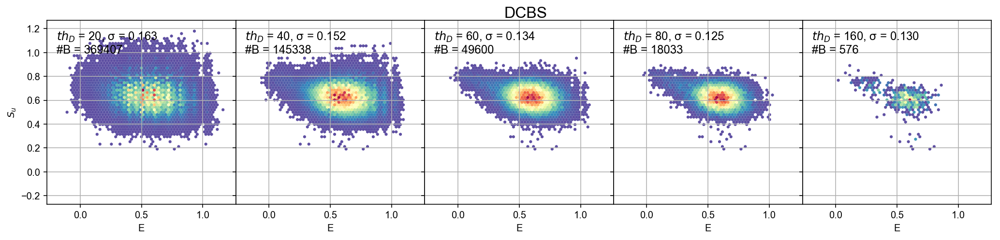

In [146]:
Th = (20, 40, 60, 80, 160)
fig, AX = plt.subplots(1, len(Th), figsize=(3.5*len(Th), 3.5), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    ax = AX[irow]
    dcs_th2 = d2.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
    dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
    Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs_th.nd, dcs_th.na, dcs_th.naa)]
    dcs_th.add(Su=Su)
    dplot(dcs_th, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
    E = dcs_th.E[0]
    E_std = E[E > 0.2].std()
    ax.text(0.05, 0.95, '$th_D$ = %d, σ = %.3f\n#B = %d' % (th, E_std, dcs_th.num_bursts), va='top', ha='left',
            transform=ax.transAxes, fontsize=12)
    ax.set_title('')
plt.setp(AX[1:], ylabel='')
AX[0].set_ylabel('$S_u$')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'DCBS', transform=fig.transFigure, fontsize=16);

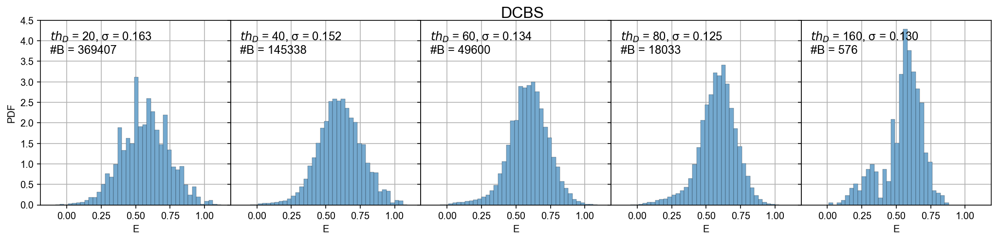

In [147]:
Th = (20, 40, 60, 80, 160)
fig, AX = plt.subplots(1, len(Th), figsize=(3.5*len(Th), 3.5), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    ax = AX[irow]
    dcs_th2 = d2.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
    dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
    dplot(dcs_th, hist_fret, ax=ax)
    E = dcs_th.E[0]
    E_std = E[E > 0.2].std()
    ax.text(0.05, 0.95, '$th_D$ = %d, σ = %.3f\n#B = %d' % (th, E_std, dcs_th.num_bursts), va='top', ha='left',
            transform=ax.transAxes, fontsize=12)
    ax.set_title('')
plt.setp(AX[1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'DCBS', transform=fig.transFigure, fontsize=16);

In [148]:
dc = d.collapse(update_gamma=False, skip_ch=skip_ch)

In [149]:
size_th = 80
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)
dcs = dc.select_bursts(select_bursts.size, th1=size_th, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs.nd, dcs.na, dcs.naa)]
dcs.add(Su=Su)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

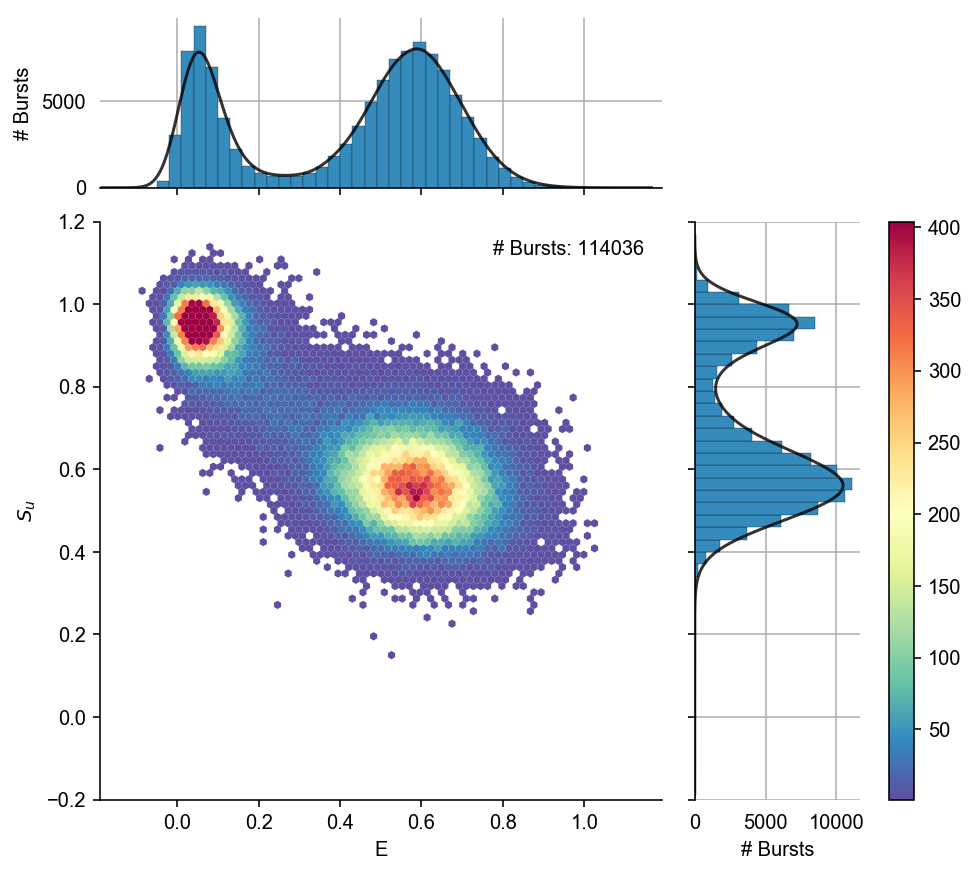

In [150]:
g = alex_jointplot(dcs, S_name='Su', vmax_fret=True, gridsize=80)
g.ax_joint.set_ylabel('$S_u$');

In [151]:
size_th = 40
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem'), gamma=0.5,
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dcs = dc.select_bursts(select_bursts.size, th1=size_th, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs.nd, dcs.na, dcs.naa)]
dcs.add(Su=Su)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

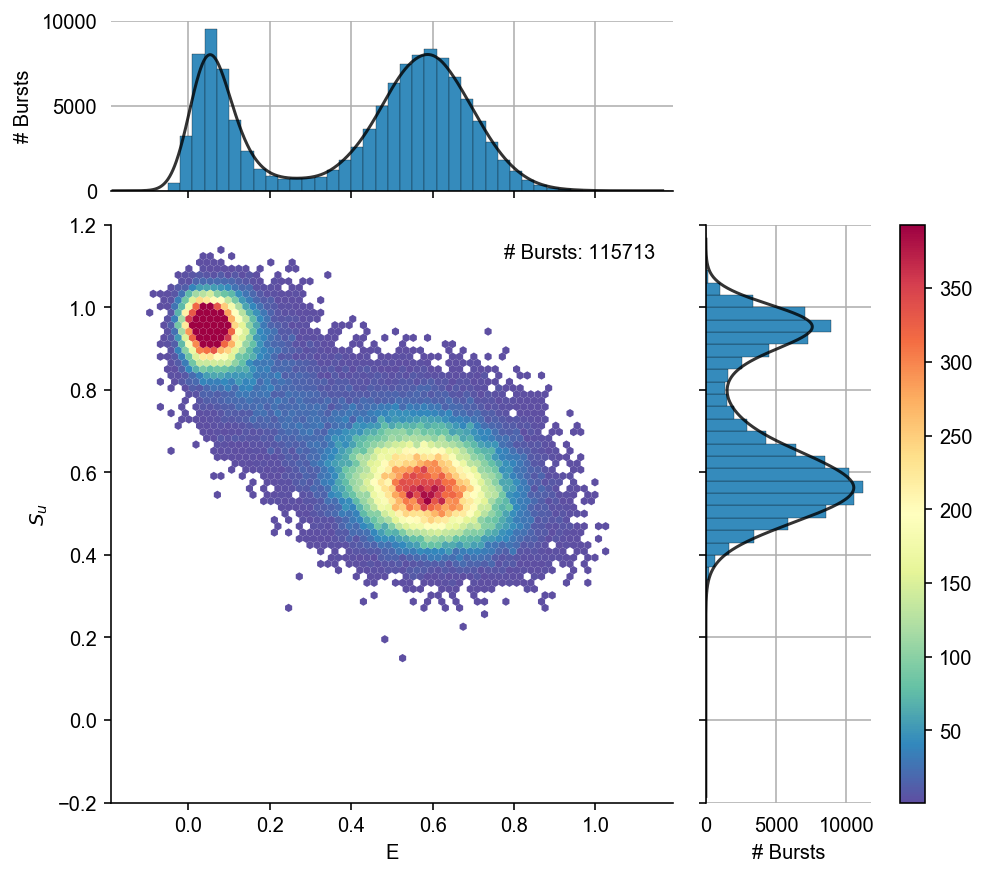

In [152]:
g = alex_jointplot(dcs, S_name='Su', vmax_fret=True, gridsize=80)
g.ax_joint.set_ylabel('$S_u$');

In [153]:
dcs15 = dcs.select_bursts(select_bursts.time, time_s1=0, time_s2=15)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs15.nd, dcs15.na, dcs15.naa)]
dcs15.add(Su=Su)

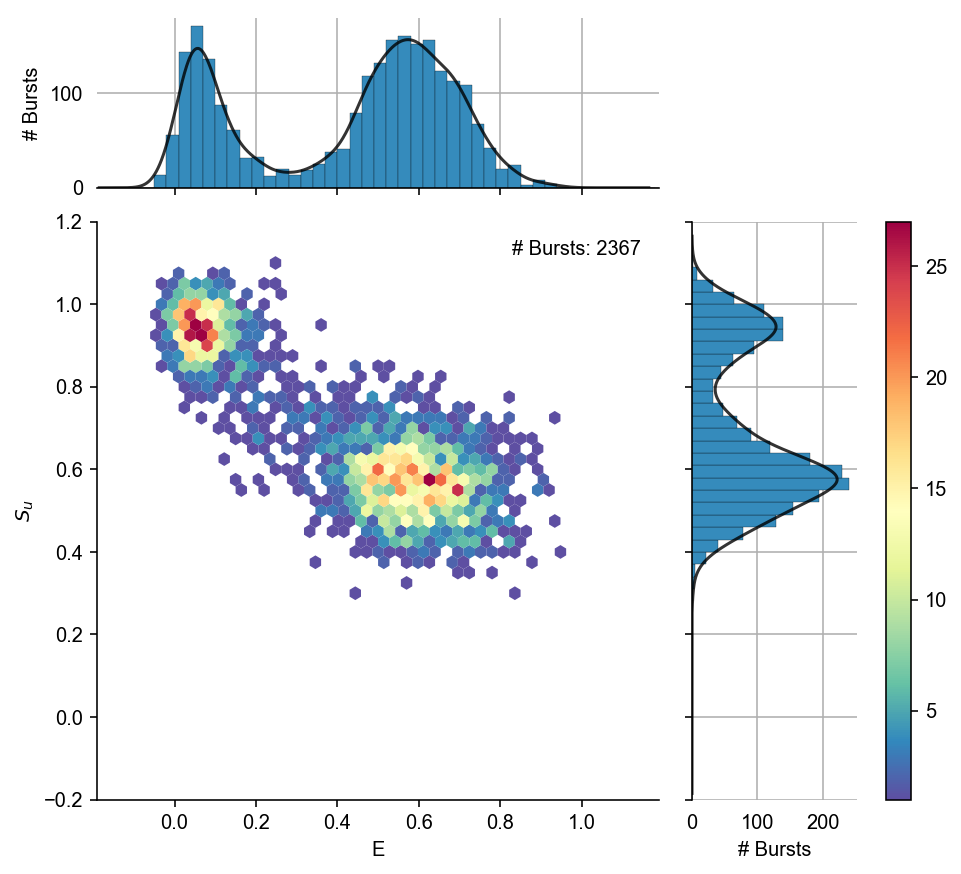

In [154]:
g = alex_jointplot(dcs15, S_name='Su')
g.ax_joint.set_ylabel('$S_u$');

In [155]:
dcs5 = dcs.select_bursts(select_bursts.time, time_s1=0, time_s2=5)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs5.nd, dcs5.na, dcs5.naa)]
dcs5.add(Su=Su)

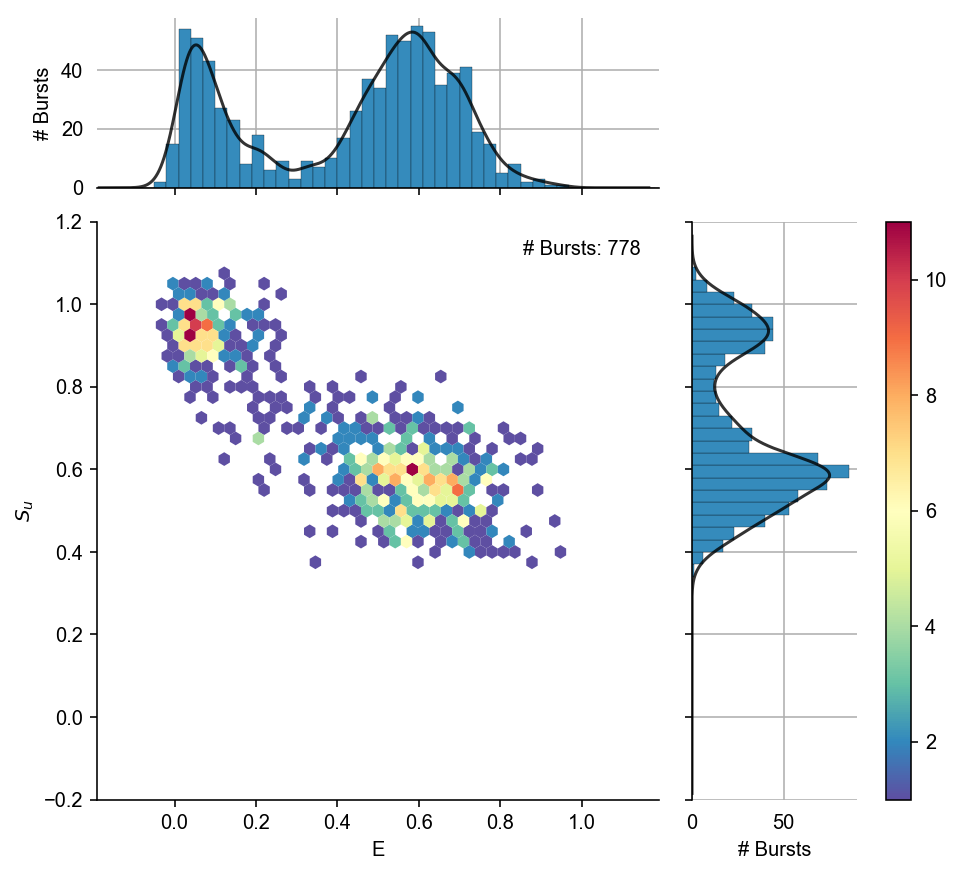

In [156]:
g = alex_jointplot(dcs5, S_name='Su')
g.ax_joint.set_ylabel('$S_u$');